<a href="https://colab.research.google.com/github/SeeBee8/Product_Sales_Predictions/blob/main/Store_Sale_Predictions_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Product Sales Predictions**



*Christina Brockway*

##Business Understanding


**Stakeholders are retailers who are interested in increasing product sales for food items.**

##**Goal:**

  - Help the retailer understand the properties of the products
  - Help the retailer understand the properties of the outlets
  - Understand the roles these properties play in sales


##**Plan of Action:**

  - Clean and Inspect the dataset
  - Look at what variables impact sales
  - Develop a strategy for predicting sales of food items based on the stores
  - Test multiple models to find definitive ways to increase sales

##Data Understanding

**Data Source**
https://datahack.analyticsvidhya.com/contest/practice-problem-big-mart-sales-iii/

######**Data Dictionary**
| **Feature Name**          | **Description**                                                                                                                                                                                               | **Other info** |
|---------------------------|---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|----------------|
| Item_Identifier           | Product ID                                                                                                                                                                                                    | --             |
| Item_Weight               | Weight of Product                                                                                                                                                                                             | numeric (g)    |
| Item_Fat_Content          | Is the product: Low Fat or Regular                                                                                                                                                                            | nominal        |
| Item_Visibility           | Total display area of all products in the store allocated to the particular product                                                                                                                           | numeric (%)    |
| Item_Type                 | The category to which the product belongs: Dairy, Soft Drinks, Meat, Fruits&Vegatables, Household, Frozen Foods, Canned, Baking, Health&Hygiene, Breads, Hard Drinks, Starchy Food, Breakfast, Seafood, Other | nominal        |
| Item_MRP                  | Maximum Retail Price(list price) of the product                                                                                                                                                               | numeric        |
| Outlet_Identifier         | Store ID                                                                                                                                                                                                      | --             |
| Outlet_Establishment_Year | The year in which the store was established                                                                                                                                                                   | --             |
| Outlet_Size               | The size of the store in terms of ground area covered                                                                                                                                                         | numeric        |
| Outlet_Type               | Grocery Store, Supermarket Type 1, 2 or 3                                                                                                                                                                     | nominal        |
| Item_Outlet_Sales         | Sales of the product in the particular store.  This is the target variable to be predicted.                                                                                                                   | numeric        |
|                           |                                                                                                                                                                                                               |                |


https://github.com/SeeBee8/Product_Sales_Predictions#data-dictionary

###Loading Data





In [ ]:
#Mount Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


###Import libraries


In [ ]:
## Our standard imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

## Preprocessing tools
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler, OrdinalEncoder
from sklearn.impute import SimpleImputer

## Models & evaluation metrics
from sklearn import metrics
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.dummy import DummyRegressor

from sklearn import set_config
set_config(transform_output='pandas')

import joblib

## setting random state for reproducibility
SEED = 42
np.random.seed(SEED)
## Matplotlib style
fav_style = ('ggplot','tableau-colorblind10')
fav_context  ={'context':'notebook', 'font_scale':1.1}
plt.style.use(fav_style)
sns.set_context(**fav_context)
plt.rcParams['savefig.transparent'] = False
plt.rcParams['savefig.bbox'] = 'tight'


## Warnings
import warnings

In [ ]:
## Display all columns
pd.set_option('display.max_column', None)

## Display all rows
pd.set_option('display.max_rows', None)

In [ ]:
## SK Learn Display
set_config(display='diagram')

## Transformers output as a Pandas Dataframe
set_config(transform_output='pandas')

###Import Custom Functions

In [ ]:
def explore_numeric(df, x, figsize=(6,5) ):
  """Source: https://login.codingdojo.com/m/606/13765/117605"""
  # Making our figure with gridspec for subplots
  gridspec = {'height_ratios':[0.7,0.3]}
  fig, axes = plt.subplots(nrows=2, figsize=figsize,
                           sharex=True, gridspec_kw=gridspec)
  # Histogram on Top
  sns.histplot(data=df, x=x, ax=axes[0])
  # Boxplot on Bottom
  sns.boxplot(data=df, x=x, ax=axes[1])
  ## Adding a title
  axes[0].set_title(f"Column: {x}")
  ## Adjusting subplots to best fill Figure
  fig.tight_layout()

  # Ensure plot is shown before message
  plt.show()
  ## Print message with info on the count and % of null values
  null_count = df[x].isna().sum()
  null_perc = null_count/len(df)* 100
  print(f"- NaN's Found: {null_count} ({round(null_perc,2)}%)")



def explore_categorical(df, x, fillna = True, placeholder = 'MISSING',
                        figsize = (6,4), order = None):
  """Source: https://login.codingdojo.com/m/606/13765/117604"""
  # Make a copy of the dataframe and fillna
  temp_df = df.copy()
  # Before filling nulls, save null value counts and percent for printing
  null_count = temp_df[x].isna().sum()
  null_perc = null_count/len(temp_df)* 100
  # fillna with placeholder
  if fillna == True:
    temp_df[x] = temp_df[x].fillna(placeholder)
  # Create figure with desired figsize
  fig, ax = plt.subplots(figsize=figsize)
  # Plotting a count plot
  sns.countplot(data=temp_df, x=x, ax=ax, order=order)
  # Rotate Tick Labels for long names
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
  # Add a title with the feature name included
  ax.set_title(f"Column: {x}")

  # Fix layout and show plot (before print statements)
  fig.tight_layout()
  plt.show()

  # Print null value info
  print(f"- NaN's Found: {null_count} ({round(null_perc,2)}%)")
  # Print cardinality info
  nunique = temp_df[x].nunique()
  print(f"- Unique Values: {nunique}")
  # First find value counts of feature
  val_counts = temp_df[x].value_counts(dropna=False)
  # Define the most common value
  most_common_val = val_counts.index[0]
  # Define the frequency of the most common value
  freq = val_counts.values[0]
  # Calculate the percentage of the most common value
  perc_most_common = freq / len(temp_df) * 100
  # Print the results
  print(f"- Most common value: '{most_common_val}' occurs {freq} times ({round(perc_most_common,2)}%)")
  # print message if quasi-constant or constant (most common val more than 98% of data)
  if perc_most_common > 98:
    print(f"\n- [!] Warning: '{x}' is a constant or quasi-constant feature and should be dropped.")
  else:
    print("- Not constant or quasi-constant.")
  return fig, ax



In [ ]:
# Updated plot_categorical_vs_target function that includes option for classification task
def plot_categorical_vs_target(df, x, y, figsize=(6,4),
                            fillna = True, placeholder = 'MISSING',
                            order = None, target_type='reg'):
  # Make a copy of the dataframe and fillna
  temp_df = df.copy()
  # fillna with placeholder
  if fillna == True:
    temp_df[x] = temp_df[x].fillna(placeholder)
  # or drop nulls prevent unwanted 'nan' group in stripplot
  else:
    temp_df = temp_df.dropna(subset=[x])
  # Create the figure and subplots
  fig, ax = plt.subplots(figsize=figsize)
  # REGRESSION-TARGET PLOT
  if target_type=='reg': #Added if statement here
    # Barplot
    sns.barplot(data=temp_df, x=x, y=y, ax=ax, order=order, alpha=0.6,
                linewidth=1, edgecolor='black', errorbar=None)
    # Boxplot
    sns.stripplot(data=temp_df, x=x, y=y, hue=x, ax=ax,
                  order=order, hue_order=order, legend=False,
                  edgecolor='white', linewidth=0.5,
                  size=3,zorder=0)
  # CLASSIFICATION-TARGET PLOT # This is the new code for the classification task
  elif target_type=='class':
    ax = sns.histplot(data=temp_df, hue=y, x=x, stat='percent',  multiple='fill')
  # Rotate xlabels
  ax.set_xticks(ax.get_xticks()) # Added this to prevent a bug
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
  # Add a title
  ax.set_title(f"{x} vs. {y}")
  fig.tight_layout()
  return fig, ax

In [ ]:
# Updated plot_numeric_vs_target that includes option for classification task
def plot_numeric_vs_target(df, x, y, figsize=(6,4),
                           target_type='reg', estimator='mean',
                           errorbar='ci',sorted=False,ascending=False,
                           **kwargs): # kwargs for sns.regplot

  nulls = df[[x,y]].isna().sum()
  if nulls.sum()>0:
    print(f"- Excluding {nulls.sum()} NaN's")
    # print(nulls)
    temp_df = df.dropna(subset=[x,y,])
  else:
    temp_df = df
  # Create the figure
  fig, ax = plt.subplots(figsize=figsize)

  # REGRESSION-TARGET PLOT
  if 'reg' in target_type:
    # Calculate the correlation
    corr = df[[x,y]].corr().round(2)
    r = corr.loc[x,y]
    # Plot the data
    scatter_kws={'ec':'white','lw':1,'alpha':0.8}
    sns.regplot(data=temp_df, x=x, y=y, ax=ax, scatter_kws=scatter_kws, **kwargs) # Included the new argument within the sns.regplot function
    ## Add the title with the correlation
    ax.set_title(f"{x} vs. {y} (r = {r})")

  # CLASSIFICATION-TARGET PLOT
  elif 'class' in target_type:

    # Sort the groups by median/mean
    if sorted == True:

      if estimator == 'median':
        group_vals = temp_df.groupby(y)[x].median()
      elif estimator =='mean':
        group_vals = temp_df.groupby(y)[x].mean()

      ## Sort values
      group_vals = group_vals.sort_values(ascending=ascending)
      order = group_vals.index

    else:
      # Set order to None if not calcualted
      order = None


    # Left Subplot (barplot)
    sns.barplot(data=temp_df, x=y, y=x, order=order,  estimator=estimator,
                errorbar=errorbar, ax=ax, **kwargs)

    # Add title
    ax.set_title(f"{x} vs. {y}")

    # rotate xaxis labels
    ax.set_xticks(ax.get_xticks())
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


  # Final Adjustments & return
  fig.tight_layout()
  fig.show()
  return fig, ax

In [ ]:
def evaluate_regression(model, X_train,y_train, X_test, y_test,for_slides=True):
    """Evaluates a scikit learn regression model using r-squared and RMSE
    FOR SLIDES VERS DOES MULTIPLE PRINT STATEMENTS FOR VERTICAL DISPLAY OF INFO"""

    ## Training Data
    y_pred_train = model.predict(X_train)
    r2_train = metrics.r2_score(y_train, y_pred_train)
    rmse_train = metrics.mean_squared_error(y_train, y_pred_train,
                                            squared=False)
    mae_train = metrics.mean_absolute_error(y_train, y_pred_train)


    ## Test Data
    y_pred_test = model.predict(X_test)
    r2_test = metrics.r2_score(y_test, y_pred_test)
    rmse_test = metrics.mean_squared_error(y_test, y_pred_test,
                                            squared=False)
    mae_test = metrics.mean_absolute_error(y_test, y_pred_test)

    if for_slides:
        df_version =[['Split','R^2','MAE','RMSE']]
        df_version.append(['Train',r2_train, mae_train, rmse_train])
        df_version.append(['Test',r2_test, mae_test, rmse_test])
        df_results = pd.DataFrame(df_version[1:], columns=df_version[0])
        df_results = df_results.round(2)
        display(df_results.style.hide(axis='index').format(precision=2, thousands=','))

    else:
        print(f"Training Data:\tR^2 = {r2_train:,.2f}\tRMSE = {rmse_train:,.2f}\tMAE = {mae_train:,.2f}")
        print(f"Test Data:\tR^2 = {r2_test:,.2f}\tRMSE = {rmse_test:,.2f}\tMAE = {mae_test:,.2f}")


In [ ]:
fpath = '/content/drive/MyDrive/CodingDojo/01-Fundamentals/Week02/Data/sales_predictions_2023.csv'
df = pd.read_csv(fpath)
df.head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228
2,FDN15,17.50,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700
3,FDX07,19.20,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store,732.3800
4,NCD19,8.93,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052


In [ ]:
#make a copy of the dataset
dfcopy = df.copy()

###Inspecting data

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Item_Identifier            8523 non-null   object 
 1   Item_Weight                7060 non-null   float64
 2   Item_Fat_Content           8523 non-null   object 
 3   Item_Visibility            8523 non-null   float64
 4   Item_Type                  8523 non-null   object 
 5   Item_MRP                   8523 non-null   float64
 6   Outlet_Identifier          8523 non-null   object 
 7   Outlet_Establishment_Year  8523 non-null   int64  
 8   Outlet_Size                6113 non-null   object 
 9   Outlet_Location_Type       8523 non-null   object 
 10  Outlet_Type                8523 non-null   object 
 11  Item_Outlet_Sales          8523 non-null   float64
dtypes: float64(4), int64(1), object(7)
memory usage: 799.2+ KB


In [ ]:
df.dtypes

Item_Identifier               object
Item_Weight                  float64
Item_Fat_Content              object
Item_Visibility              float64
Item_Type                     object
Item_MRP                     float64
Outlet_Identifier             object
Outlet_Establishment_Year      int64
Outlet_Size                   object
Outlet_Location_Type          object
Outlet_Type                   object
Item_Outlet_Sales            float64
dtype: object

In [ ]:
df.shape

(8523, 12)

**Initial Observations**

- There are 8523 records(rows)
- There are 12 features(columns)
- 7 object columns (2 ordinal, 5 nominal)
- 4 float and 1 int column (int column is year)
- Item Weight and Outlet Size both have several null values
- Item Sales is our target feature
- All data types are as they should be


##Data Cleaning

In [ ]:
#Checking for duplicates
duplicate_rows = df.duplicated(keep=False)
duplicate_rows.sum()


0

In [ ]:
#Checking for unique values
df.nunique()

Item_Identifier              1559
Item_Weight                   415
Item_Fat_Content                5
Item_Visibility              7880
Item_Type                      16
Item_MRP                     5938
Outlet_Identifier              10
Outlet_Establishment_Year       9
Outlet_Size                     3
Outlet_Location_Type            3
Outlet_Type                     4
Item_Outlet_Sales            3493
dtype: int64

In [ ]:
df.nunique()/len(df) * 100

Item_Identifier              18.291681
Item_Weight                   4.869178
Item_Fat_Content              0.058665
Item_Visibility              92.455708
Item_Type                     0.187727
Item_MRP                     69.670304
Outlet_Identifier             0.117330
Outlet_Establishment_Year     0.105597
Outlet_Size                   0.035199
Outlet_Location_Type          0.035199
Outlet_Type                   0.046932
Item_Outlet_Sales            40.983222
dtype: float64

**The following columns have a high cardinality**
- Item identifier
- Item Visibility
- Item MRP

In [ ]:
duplicated_IId = df.duplicated(subset=['Item_Identifier'],keep=False)
duplicated_IId.sum()

8514

In [ ]:
df[duplicated_IId].sort_values('Item_Identifier')

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
118,DRA12,11.600,Low Fat,0.041178,Soft Drinks,140.3154,OUT017,2007,NaN,Tier 2,Supermarket Type1,2552.6772
7467,DRA12,11.600,Low Fat,0.041113,Soft Drinks,142.0154,OUT018,2009,Medium,Tier 3,Supermarket Type2,850.8924
1693,DRA12,11.600,LF,0.000000,Soft Drinks,141.9154,OUT035,2004,Small,Tier 2,Supermarket Type1,992.7078
1245,DRA12,11.600,Low Fat,0.040912,Soft Drinks,142.3154,OUT013,1987,High,Tier 3,Supermarket Type1,2552.6772
8043,DRA12,11.600,Low Fat,0.068535,Soft Drinks,143.0154,OUT010,1998,NaN,Tier 3,Grocery Store,283.6308
1197,DRA12,11.600,Low Fat,0.000000,Soft Drinks,141.6154,OUT045,2002,NaN,Tier 2,Supermarket Type1,3829.0158
4416,DRA24,NaN,Regular,0.039735,Soft Drinks,165.7868,OUT027,1985,Medium,Tier 3,Supermarket Type3,4913.6040
8195,DRA24,19.350,Regular,0.039895,Soft Drinks,162.4868,OUT013,1987,High,Tier 3,Supermarket Type1,4422.2436
4130,DRA24,19.350,Regular,0.066832,Soft Drinks,163.8868,OUT010,1998,NaN,Tier 3,Grocery Store,327.5736
1148,DRA24,19.350,Regular,0.040154,Soft Drinks,164.6868,OUT017,2007,NaN,Tier 2,Supermarket Type1,1146.5076


*There don't appear to be any duplicated rows or columns*

*The Item_Identifier is not unique to each item*

###Checking for missing values:

In [ ]:
df.dtypes

Item_Identifier               object
Item_Weight                  float64
Item_Fat_Content              object
Item_Visibility              float64
Item_Type                     object
Item_MRP                     float64
Outlet_Identifier             object
Outlet_Establishment_Year      int64
Outlet_Size                   object
Outlet_Location_Type          object
Outlet_Type                   object
Item_Outlet_Sales            float64
dtype: object

In [ ]:
cat_cols = df.select_dtypes('object').columns
cat_cols

Index(['Item_Identifier', 'Item_Fat_Content', 'Item_Type', 'Outlet_Identifier',
       'Outlet_Size', 'Outlet_Location_Type', 'Outlet_Type'],
      dtype='object')

In [ ]:
#Checking for missing values by category columns
df[cat_cols].isna().sum()

Item_Identifier            0
Item_Fat_Content           0
Item_Type                  0
Outlet_Identifier          0
Outlet_Size             2410
Outlet_Location_Type       0
Outlet_Type                0
dtype: int64

In [ ]:
df[cat_cols].isna().sum()/len(df[cat_cols]) * 100

Item_Identifier          0.000000
Item_Fat_Content         0.000000
Item_Type                0.000000
Outlet_Identifier        0.000000
Outlet_Size             28.276428
Outlet_Location_Type     0.000000
Outlet_Type              0.000000
dtype: float64

**Missing Values:**


*   *There are 2410 missing values in the Outlet Size column (28.2%)*

*   *No other column appears to have any missing values in the Categorical datasets*



In [ ]:
#Checking for missing columns by numeric columns
numeric_cols = df.select_dtypes('number').columns
numeric_cols

Index(['Item_Weight', 'Item_Visibility', 'Item_MRP',
       'Outlet_Establishment_Year', 'Item_Outlet_Sales'],
      dtype='object')

In [ ]:
df[numeric_cols].isna().sum()

Item_Weight                  1463
Item_Visibility                 0
Item_MRP                        0
Outlet_Establishment_Year       0
Item_Outlet_Sales               0
dtype: int64

In [ ]:
df[numeric_cols].isna().sum()/ len(df[numeric_cols]) * 100


Item_Weight                  17.165317
Item_Visibility               0.000000
Item_MRP                      0.000000
Outlet_Establishment_Year     0.000000
Item_Outlet_Sales             0.000000
dtype: float64

**Missing Values:**


*   *There are 1463 missing values in the Item_Weight column (17.17%)*

*   *No other column appears to have any missing values in the Numerical datasets*

###Address Missing Values

*To deal with missing object values:*

*Use "MISSING' to replace missing values*

**This section of code has been deactivated for ML**

In [ ]:
#Replace Nan with 'Missing'
#df[cat_cols] = df[cat_cols].fillna('Missing')
#df[cat_cols].isna().sum()

In [ ]:
#Checking missing columns are fixed for category types
df[cat_cols].isna().sum()

Item_Identifier            0
Item_Fat_Content           0
Item_Type                  0
Outlet_Identifier          0
Outlet_Size             2410
Outlet_Location_Type       0
Outlet_Type                0
dtype: int64

*To deal with missing numeric values in the "Item_Weight' column:*

*Use -1 to replace missing values*

**This section of code has been deactivated for ML**

In [ ]:
#Replace missing weights with -1
#df['Item_Weight'] = df['Item_Weight'].fillna(-1)

In [ ]:
#Check missing values were filled in
df.isna().sum()

Item_Identifier                 0
Item_Weight                  1463
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  2410
Outlet_Location_Type            0
Outlet_Type                     0
Item_Outlet_Sales               0
dtype: int64

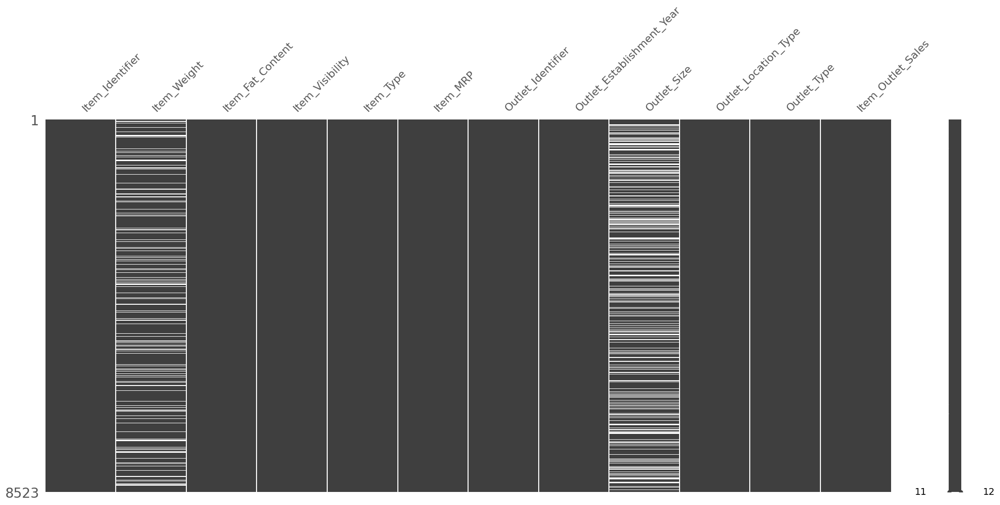

In [ ]:
msno.matrix(df);

*It appears all missing values have been fixed* **This section of code has been deactivated for ML**

###Checking for Inconsistencies

In [ ]:
#Check for inconsistent values
cat_cols

Index(['Item_Identifier', 'Item_Fat_Content', 'Item_Type', 'Outlet_Identifier',
       'Outlet_Size', 'Outlet_Location_Type', 'Outlet_Type'],
      dtype='object')

In [ ]:
for col in cat_cols:
  print(f'{col}:')
  print(df[col].value_counts(dropna=False))
  print('\n')

Item_Identifier:
FDW13    10
FDG33    10
NCY18     9
FDD38     9
DRE49     9
FDV60     9
NCQ06     9
FDF52     9
FDX04     9
NCJ30     9
FDV38     9
NCF42     9
FDT07     9
FDW26     9
NCL31     9
FDU12     9
FDG09     9
FDQ40     9
FDX20     9
NCI54     9
FDX31     9
FDP25     9
FDW49     9
FDF56     9
FDO19     9
DRN47     9
NCB18     9
FDE11     8
NCX05     8
FDQ39     8
FDT55     8
FDO32     8
FDT40     8
FDZ20     8
FDH27     8
FDY49     8
FDS33     8
FDR04     8
FDR43     8
FDR59     8
FDJ55     8
FDT24     8
FDY55     8
FDV09     8
FDU23     8
FDY47     8
DRD25     8
FDK58     8
FDL58     8
FDX58     8
FDR44     8
FDP28     8
FDA39     8
FDH28     8
DRF27     8
FDX21     8
FDY56     8
FDF05     8
FDL20     8
FDY03     8
NCK05     8
FDS55     8
DRA59     8
FDG24     8
NCE54     8
FDZ21     8
FDA04     8
FDW24     8
FDT49     8
DRF23     8
FDD05     8
FDH10     8
FDX50     8
FDT32     8
FDK20     8
FDU13     8
FDN56     8
FDZ26     8
FDL34     8
DRF01     8
FDG38     8
NCE31     8

**The following data was returned for Item_Fat_Content:**

  - Low Fat    5089

  - Regular    2889

  - LF          316

  - reg         117

  - low fat     112


*After reviewing this data set it looks like LF and low fat and Low Fat are the same*.

*Also reg and Regular are the same.*  

LF and low fat will be replaced with Low Fat, and reg will be replaced with Regular

In [ ]:
df['Item_Fat_Content'] = df['Item_Fat_Content'].replace('LF', 'Low Fat')
df['Item_Fat_Content'] = df['Item_Fat_Content'].replace('low fat', 'Low Fat')
df['Item_Fat_Content'] = df['Item_Fat_Content'].replace('reg', 'Regular')


In [ ]:
#Check the change was made
df['Item_Fat_Content'].value_counts(dropna=False)

Low Fat    5517
Regular    3006
Name: Item_Fat_Content, dtype: int64

In [ ]:
#Check other numeric features for possible placehoders
#Check summary stats
df.describe().round()

,Item_Weight,Item_Visibility,Item_MRP,Outlet_Establishment_Year,Item_Outlet_Sales
count,7060.0,8523.0,8523.0,8523.0,8523.0
mean,13.0,0.0,141.0,1998.0,2181.0
std,5.0,0.0,62.0,8.0,1706.0
min,5.0,0.0,31.0,1985.0,33.0
25%,9.0,0.0,94.0,1987.0,834.0
50%,13.0,0.0,143.0,1999.0,1794.0
75%,17.0,0.0,186.0,2004.0,3101.0
max,21.0,0.0,267.0,2009.0,13087.0


In [ ]:
df["Item_Visibility"].describe()

count    8523.000000
mean        0.066132
std         0.051598
min         0.000000
25%         0.026989
50%         0.053931
75%         0.094585
max         0.328391
Name: Item_Visibility, dtype: float64

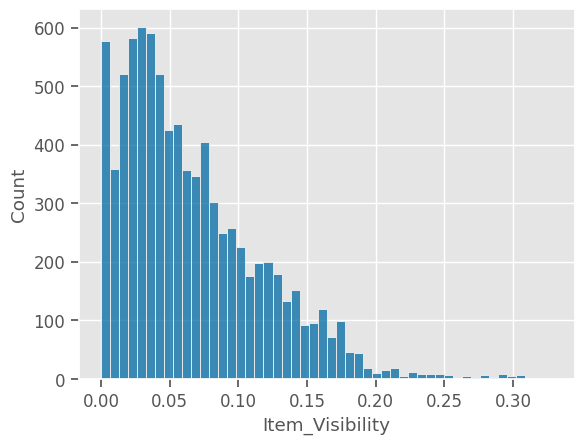

In [ ]:
#Inpect Item Visibilty using Seaborn
ax=sns.histplot(data = df, x = 'Item_Visibility')

The column Item_Visibility is all zeros.  On further inspection perhaps showing this column as a percentage would be more useful.


In [ ]:
Percent_Visibility = df['Item_Visibility'].map('{:,.2%}'.format)
Percent_Visibility

0        1.60%
1        1.93%
2        1.68%
3        0.00%
4        0.00%
5        0.00%
6        1.27%
7       12.75%
8        1.67%
9        9.44%
10       0.00%
11       4.55%
12      10.00%
13       4.73%
14       6.80%
15       6.91%
16       0.86%
17       6.92%
18       3.42%
19      10.25%
20      13.82%
21       3.54%
22       2.57%
23       5.76%
24       2.59%
25       9.99%
26       6.67%
27       1.94%
28      16.15%
29       7.22%
30      17.03%
31       8.08%
32       0.00%
33       0.00%
34       9.79%
35       8.93%
36       5.95%
37      11.31%
38      12.31%
39       2.65%
40      10.25%
41       2.68%
42      11.78%
43       6.91%
44       4.23%
45       8.95%
46       0.00%
47       2.59%
48      12.16%
49      25.54%
50       6.78%
51      15.98%
52       2.87%
53       6.50%
54       2.88%
55       1.01%
56       4.82%
57       7.20%
58      17.35%
59       6.11%
60       0.00%
61       4.01%
62       1.21%
63      15.03%
64       2.60%
65      19.51%
66       3

In [ ]:
#Add Percent_Visibility column
df['Percent_Visiblity']= Percent_Visibility
df.head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales,Percent_Visiblity
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380,1.60%
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228,1.93%
2,FDN15,17.50,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700,1.68%
3,FDX07,19.20,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store,732.3800,0.00%
4,NCD19,8.93,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052,0.00%


##Save the clean DataFrame

In [ ]:
fpath_out = "/content/drive/MyDrive/CodingDojo/01-Fundamentals/Week02/Data/cleaned_sales_predictions.csv"
df.to_csv(fpath_out, index=True)

#Explore the Data

In [ ]:
df.head()


,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales,Percent_Visiblity
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380,1.60%
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228,1.93%
2,FDN15,17.50,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700,1.68%
3,FDX07,19.20,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store,732.3800,0.00%
4,NCD19,8.93,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052,0.00%


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Item_Identifier            8523 non-null   object 
 1   Item_Weight                7060 non-null   float64
 2   Item_Fat_Content           8523 non-null   object 
 3   Item_Visibility            8523 non-null   float64
 4   Item_Type                  8523 non-null   object 
 5   Item_MRP                   8523 non-null   float64
 6   Outlet_Identifier          8523 non-null   object 
 7   Outlet_Establishment_Year  8523 non-null   int64  
 8   Outlet_Size                6113 non-null   object 
 9   Outlet_Location_Type       8523 non-null   object 
 10  Outlet_Type                8523 non-null   object 
 11  Item_Outlet_Sales          8523 non-null   float64
 12  Percent_Visiblity          8523 non-null   object 
dtypes: float64(4), int64(1), object(8)
memory usage:

####Use countplots to show the frequency of outlet variables

In [ ]:
#Create a DataFrame that includes only the outlet variables
dfoutlets= df[['Outlet_Identifier', 'Outlet_Establishment_Year','Outlet_Size', 'Outlet_Location_Type', 'Outlet_Type']]
dfoutlets.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 5 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   Outlet_Identifier          8523 non-null   object
 1   Outlet_Establishment_Year  8523 non-null   int64 
 2   Outlet_Size                6113 non-null   object
 3   Outlet_Location_Type       8523 non-null   object
 4   Outlet_Type                8523 non-null   object
dtypes: int64(1), object(4)
memory usage: 333.1+ KB


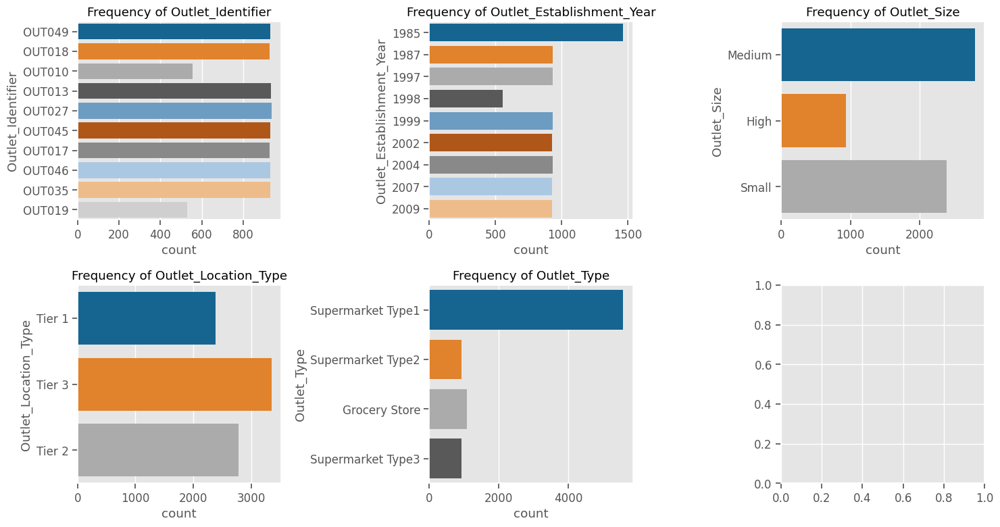

In [ ]:
#Make a for loop to show countplots of item variables
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(15,8))
plt.subplots_adjust(hspace=0.5)

for col, ax in zip(dfoutlets, axs.ravel()):
  sns.countplot(data = dfoutlets, y= dfoutlets[col], ax=ax)
  ax.set_title(f'Frequency of {col}')

plt.tight_layout()

####**Observations**
*Outlet_Identifier has several variables, they are relatively well represented*

*Outlet_Establishment_Year may be useful in a correlation heatmap*

*For the Outlet_Size variable there are a lot of missing values*

*Outlet_Location_Type may be useful in a mutilvariate visualization*


####Use Histograms to Distribution of numerical features

In [ ]:
#Create a dataframe fo
dfnumeric=df[numeric_cols]
dfnumeric.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 5 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Item_Weight                7060 non-null   float64
 1   Item_Visibility            8523 non-null   float64
 2   Item_MRP                   8523 non-null   float64
 3   Outlet_Establishment_Year  8523 non-null   int64  
 4   Item_Outlet_Sales          8523 non-null   float64
dtypes: float64(4), int64(1)
memory usage: 333.1 KB


In [ ]:
len(dfnumeric.columns)

5

In [ ]:
my_numbers = [1, 2, 3]
my_letters = ['a', 'b', 'c', 'd']

list(zip(my_numbers, my_letters))

[(1, 'a'), (2, 'b'), (3, 'c')]

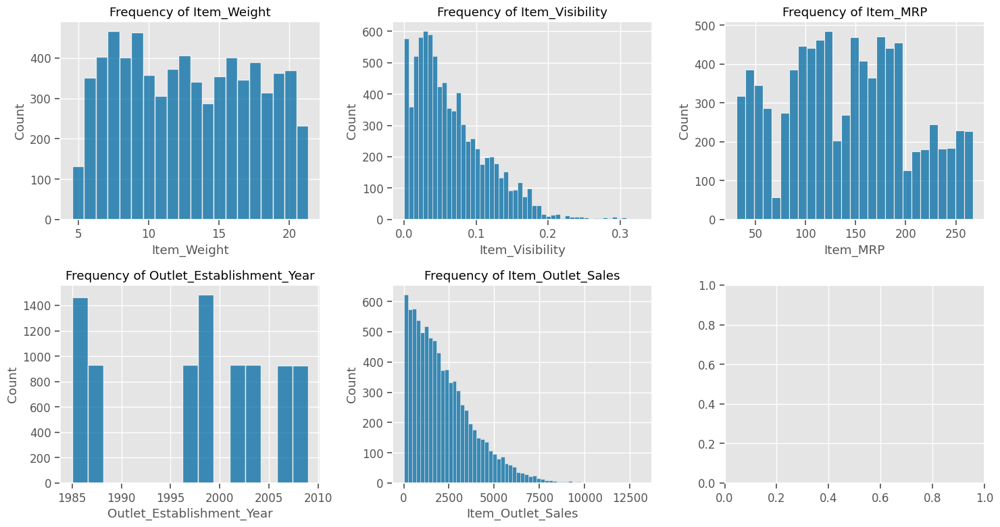

In [ ]:
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(15,8))
plt.subplots_adjust(hspace=0.5)

for col, ax in zip(dfnumeric, axs.ravel()):
  sns.histplot(data = dfnumeric, x= dfnumeric[col], ax=ax)
  ax.set_title(f'Frequency of {col}')

plt.tight_layout()

####**Observations**

*Item_Weight are relatively well represented.  There are a whole lot of very light items.*

*The visiblity of items is increased as the number of items goes down.*

*For the Item_MRP variable there is a large sampling of data that seems unrelated to number of items.*

*Histogram of Oulet_Establishment_Year seems useless*

*As the count decreases the Item_Outlet_Sales value increases*

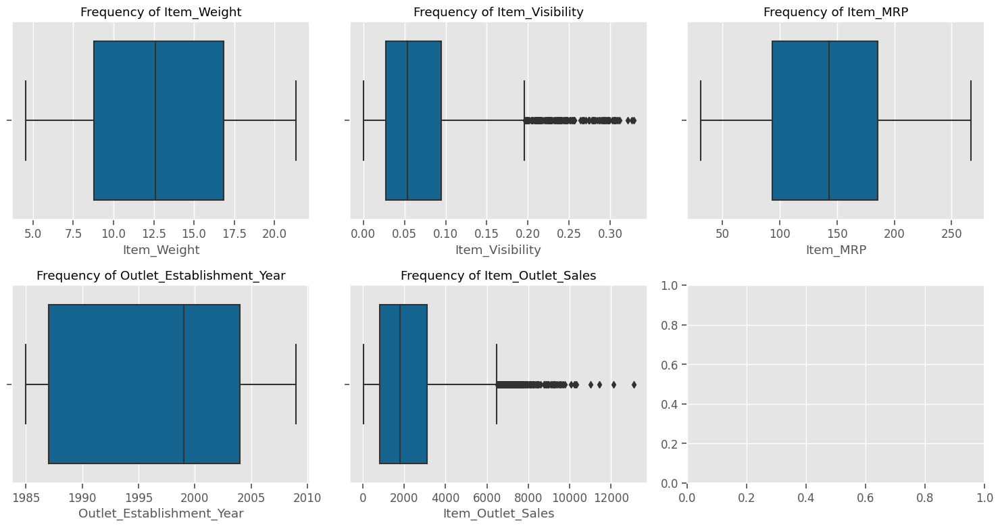

In [ ]:
#Make a for loop to show countplots of item variables
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(15,8))
plt.subplots_adjust(hspace=0.5)

for col, ax in zip(dfnumeric, axs.ravel()):
  sns.boxplot(data = dfnumeric, x= dfnumeric[col], ax=ax)
  ax.set_title(f'Frequency of {col}')

plt.tight_layout()

####**Observations**

*Item_Weight:  Almost all items lie between 5 and 18 lbs, no visible outliers.*

*Item_Visibility: The visiblity of items is low the majority of the time.  There are several items that don't fall in the box.*

*Item_MRP: All of the items lie between 90 and 190, no visible outliers.*

*Outlet_Establishment_Year seems useless*

*Item-Sales: Most of the values fall between 1000 and 3000.  There are several ouliers.*

###Look at correlations for Item_Outlet_Sales

In [ ]:
#Get correlations
corr=df.corr(numeric_only=True)
corr.round(2)

,Item_Weight,Item_Visibility,Item_MRP,Outlet_Establishment_Year,Item_Outlet_Sales
Item_Weight,1.00,-0.01,0.03,-0.01,0.01
Item_Visibility,-0.01,1.00,-0.00,-0.07,-0.13
Item_MRP,0.03,-0.00,1.00,0.01,0.57
Outlet_Establishment_Year,-0.01,-0.07,0.01,1.00,-0.05
Item_Outlet_Sales,0.01,-0.13,0.57,-0.05,1.00


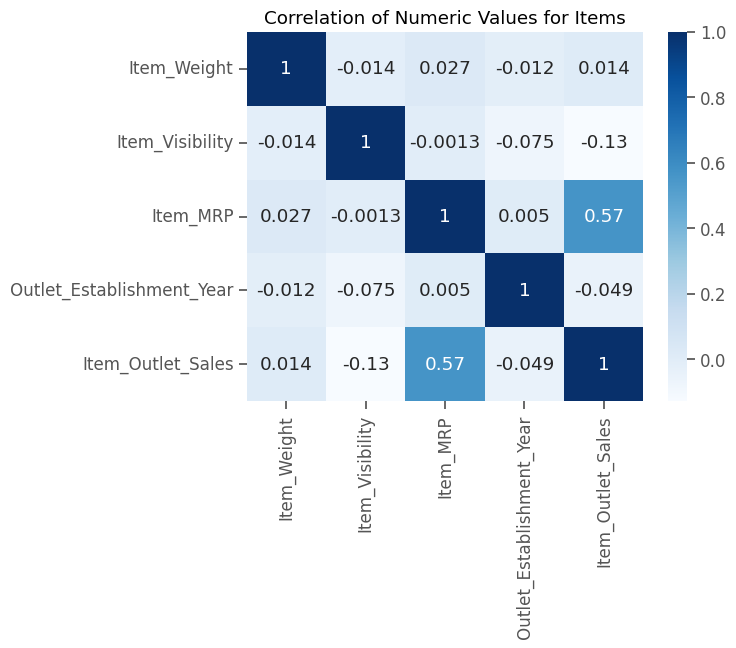

In [ ]:
#Use a heat map to visualize correlations
ax= sns.heatmap(corr, cmap='Blues', annot=True);
ax.set_title('Correlation of Numeric Values for Items');

####**Observations:**

*There is a slight positive correlation between Item_MRP and Item_Outlet_Sales*

*There are no other significant correlations in this dataset*

#Exploratory Data Analysis

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Item_Identifier            8523 non-null   object 
 1   Item_Weight                7060 non-null   float64
 2   Item_Fat_Content           8523 non-null   object 
 3   Item_Visibility            8523 non-null   float64
 4   Item_Type                  8523 non-null   object 
 5   Item_MRP                   8523 non-null   float64
 6   Outlet_Identifier          8523 non-null   object 
 7   Outlet_Establishment_Year  8523 non-null   int64  
 8   Outlet_Size                6113 non-null   object 
 9   Outlet_Location_Type       8523 non-null   object 
 10  Outlet_Type                8523 non-null   object 
 11  Item_Outlet_Sales          8523 non-null   float64
 12  Percent_Visiblity          8523 non-null   object 
dtypes: float64(4), int64(1), object(8)
memory usage:

*There are 13 features*

*8 objects, 1 int, and 4 floats*

##Explore Catagorical Data

####Item Identifier

*Description: Product ID*

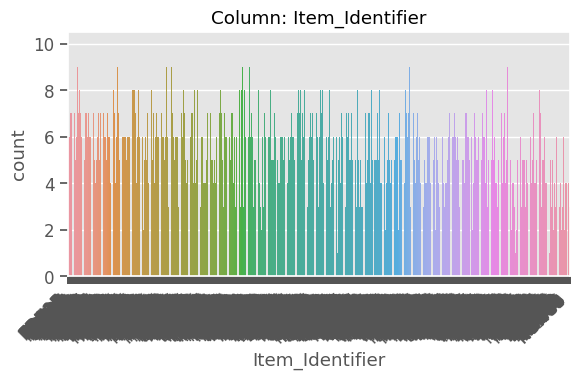

- NaN's Found: 0 (0.0%)
- Unique Values: 1559
- Most common value: 'FDW13' occurs 10 times (0.12%)
- Not constant or quasi-constant.


In [ ]:
explore_categorical(df,"Item_Identifier");


  - **What type of feature is it?** *Categorical*
  - **How many null values?** *0 (0.0%)*
  - **What would you do with the null values?**    *N/A*
  - **Is the feature constant or quasi-constant?**  *Not Constant or quasi-constant*
  - **What is the cardinality? Is it high (>10)?** *Yes*
  - **Would we know this feature before the target is determined?** *Yes*
  - **Is there a business case/understanding reason to exclude based on our business case?** *Yes, there are just too many different values to make this a usable variable.*  

---Will drop this column---



####Item Fat Content

*Description: Whether the product is low-fat or regular*

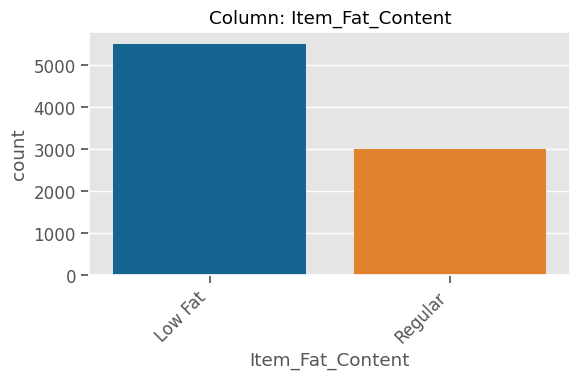

- NaN's Found: 0 (0.0%)
- Unique Values: 2
- Most common value: 'Low Fat' occurs 5517 times (64.73%)
- Not constant or quasi-constant.


In [ ]:
explore_categorical(df,"Item_Fat_Content");

  - **What type of feature is it?** *Categorical*
  - **How many null values?** *0(0.0%)*
  - **What would you do with the null values?**  *N/A*
  - **Is the feature constant or quasi-constant?** *Niether constant or quasi_constant*
  - **What is the cardinality? Is it high (>10)?** *Low cardinality*
  - **Would we know this feature before the target is determined?** *Yes*
  - **Is there a business case/understanding reason to exclude based on our business case?**  *No*

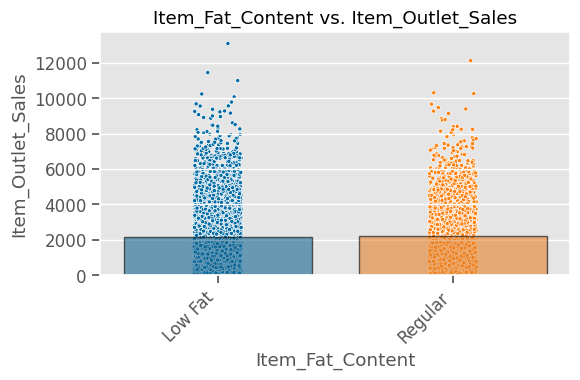

In [ ]:
plot_categorical_vs_target(df, "Item_Fat_Content", 'Item_Outlet_Sales');

  - **Based on business understanding, would this feature to be a predictor of the target?**  *No*
  - **Does this feature appear to be a predictor of the target?**  *No*

####Item Type

*The category to which the product belongs*

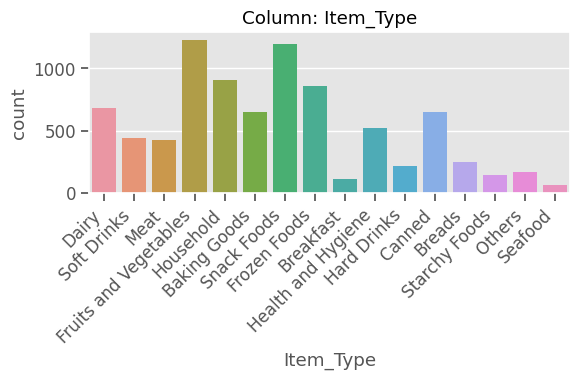

- NaN's Found: 0 (0.0%)
- Unique Values: 16
- Most common value: 'Fruits and Vegetables' occurs 1232 times (14.46%)
- Not constant or quasi-constant.


In [ ]:
explore_categorical(df,"Item_Type");

  - **What type of feature is it?** *Categorical*
  - **How many null values?** *0(0.0%)*
  - **What would you do with the null values?**  *N/A*
  - **Is the feature constant or quasi-constant?** *Niether constant or quasi_constant*
  - **What is the cardinality? Is it high (>10)?** *High cardinality*
  - **Would we know this feature before the target is determined?** *Yes*
  - **Is there a business case/understanding reason to exclude based on our business case?**  *No*

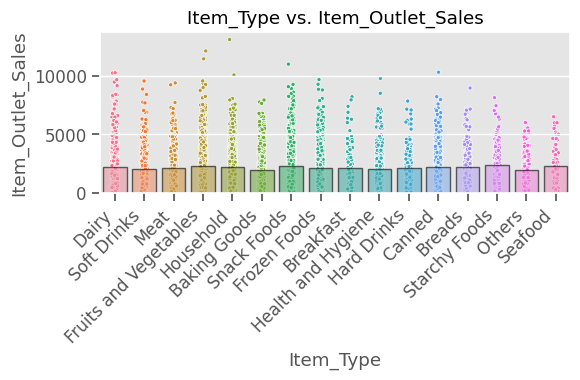

In [ ]:
plot_categorical_vs_target(df, 'Item_Type',  'Item_Outlet_Sales');

  - **Based on business understanding, would this feature to be a predictor of the target?**  *Possibly*
  - **Does this feature appear to be a predictor of the target?**  *It's worth looking at further*


####Outlet Identifier

*Store ID*

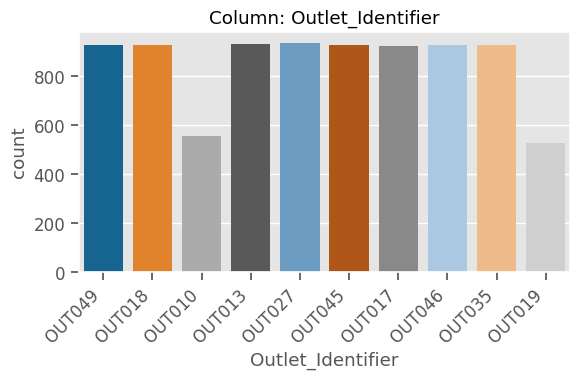

- NaN's Found: 0 (0.0%)
- Unique Values: 10
- Most common value: 'OUT027' occurs 935 times (10.97%)
- Not constant or quasi-constant.


In [ ]:
explore_categorical(df,"Outlet_Identifier");

  - **What type of feature is it?** *Categorical*
  - **How many null values?** *0(0.0%)*
  - **What would you do with the null values?**  *N/A*
  - **Is the feature constant or quasi-constant?** *Niether constant or quasi_constant*
  - **What is the cardinality? Is it high (>10)?** *Moderate cardinality*
  - **Would we know this feature before the target is determined?** *Yes*
  - **Is there a business case/understanding reason to exclude based on our business case?**  *No*

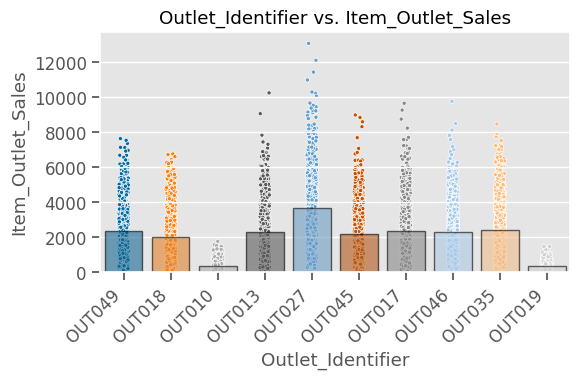

In [ ]:
plot_categorical_vs_target(df, 'Outlet_Identifier',  'Item_Outlet_Sales');

  - **Based on business understanding, would this feature to be a predictor of the target?**  *Possibly*
  - **Does this feature appear to be a predictor of the target?**  *yes, there are some clear indicators of which outlets do better than others*

####Outlet Size

*The size of the store in terms of ground area covered*

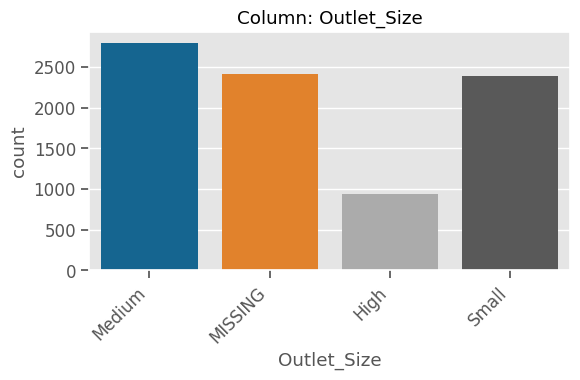

- NaN's Found: 2410 (28.28%)
- Unique Values: 4
- Most common value: 'Medium' occurs 2793 times (32.77%)
- Not constant or quasi-constant.


In [ ]:
explore_categorical(df,"Outlet_Size");

  - **What type of feature is it?** *Categorical*
  - **How many null values?** *2410 (28.28%)*
  - **What would you do with the null values?**  *Consider dropping the column, will inspect the values*
  - **Is the feature constant or quasi-constant?** *Niether constant or quasi_constant*
  - **What is the cardinality? Is it high (>10)?** *Low cardinality*
  - **Would we know this feature before the target is determined?** *Yes*
  - **Is there a business case/understanding reason to exclude based on our business case?**  *No*

*Look at missing values*

In [ ]:
#Create a DataFrame focused on Outlet information
df_outlet=df[['Outlet_Size', 'Outlet_Identifier', 'Outlet_Type']]
df_outlet

,Outlet_Size,Outlet_Identifier,Outlet_Type
0,Medium,OUT049,Supermarket Type1
1,Medium,OUT018,Supermarket Type2
2,Medium,OUT049,Supermarket Type1
3,NaN,OUT010,Grocery Store
4,High,OUT013,Supermarket Type1
5,Medium,OUT018,Supermarket Type2
6,High,OUT013,Supermarket Type1
7,Medium,OUT027,Supermarket Type3
8,NaN,OUT045,Supermarket Type1
9,NaN,OUT017,Supermarket Type1


In [ ]:
df_outlet.loc[df_outlet['Outlet_Identifier']== 'OUT010']

,Outlet_Size,Outlet_Identifier,Outlet_Type
3,NaN,OUT010,Grocery Store
28,NaN,OUT010,Grocery Store
30,NaN,OUT010,Grocery Store
45,NaN,OUT010,Grocery Store
65,NaN,OUT010,Grocery Store
90,NaN,OUT010,Grocery Store
122,NaN,OUT010,Grocery Store
133,NaN,OUT010,Grocery Store
139,NaN,OUT010,Grocery Store
174,NaN,OUT010,Grocery Store


In [ ]:
#make a table showing count of outlet identfiers by size
df_outlet.fillna('MISSING').groupby(['Outlet_Identifier', "Outlet_Size"]).count()

,,Outlet_Type
Outlet_Identifier,Outlet_Size,
OUT010,MISSING,555
OUT013,High,932
OUT017,MISSING,926
OUT018,Medium,928
OUT019,Small,528
OUT027,Medium,935
OUT035,Small,930
OUT045,MISSING,929
OUT046,Small,930


*For specific outlets, based off the identifier, the outlet size is missing and there is not a way to reconcile that value*

*The number of sales for these outlets might be a useful variable, it would need further exploration*

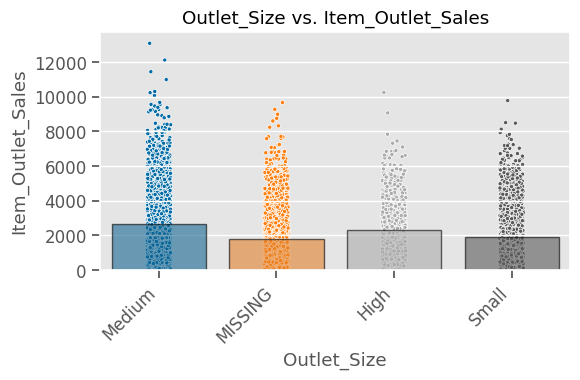

In [ ]:
plot_categorical_vs_target(df,'Outlet_Size', 'Item_Outlet_Sales');

  - **Based on business understanding, would this feature to be a predictor of the target?**  *possibly*
  - **Does this feature appear to be a predictor of the target?**  *only slightly*

####Outlet Location Type

*The type of area in which the store is located*

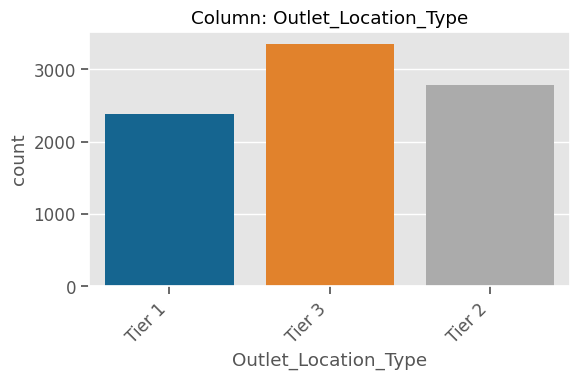

- NaN's Found: 0 (0.0%)
- Unique Values: 3
- Most common value: 'Tier 3' occurs 3350 times (39.31%)
- Not constant or quasi-constant.


In [ ]:
explore_categorical(df,"Outlet_Location_Type");

  - **What type of feature is it?** (Categorical (nominal), ordinal, numeric)
  - **How many null values? What percentage? What would you do with the null values (drop the rows? drop the column? impute? If impute, with what?)**
  - **Is the feature constant or quasi-constant?**
  - **What is the cardinality? Is it high (>10)?**
  - **Would we know this feature before the target is determined?**
  - **Is there a business case/understanding reason to exclude based on our business case?**

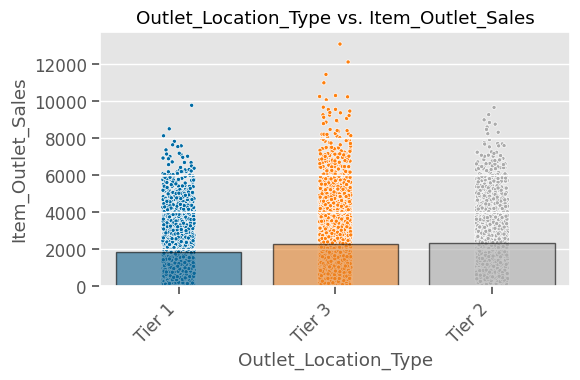

In [ ]:
plot_categorical_vs_target(df, 'Outlet_Location_Type',  'Item_Outlet_Sales');

  - **Based on business understanding, would this feature to be a predictor of the target?**  *Yes*
  - **Does this feature appear to be a predictor of the target?**  *Yes*

####Outlet Type

*Whether the outlet is a grocery store or some sort of supermarket*

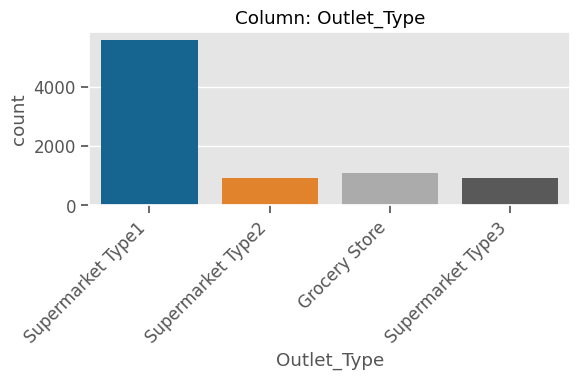

- NaN's Found: 0 (0.0%)
- Unique Values: 4
- Most common value: 'Supermarket Type1' occurs 5577 times (65.43%)
- Not constant or quasi-constant.


In [ ]:
explore_categorical(df,"Outlet_Type");

  - **What type of feature is it?** *Categorical*
  - **How many null values?** *0(0.0%)*
  - **What would you do with the null values?**  *N/A*
  - **Is the feature constant or quasi-constant?** *Niether constant or quasi_constant*
  - **What is the cardinality? Is it high (>10)?** *Moderate cardinality*
  - **Would we know this feature before the target is determined?** *Yes*
  - **Is there a business case/understanding reason to exclude based on our business case?**  *No*

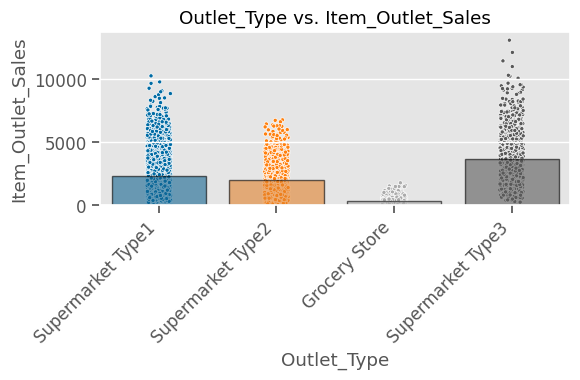

In [ ]:
plot_categorical_vs_target(df,'Outlet_Type',  'Item_Outlet_Sales');

  - **Based on business understanding, would this feature to be a predictor of the target?**  *Yes*
  - **Does this feature appear to be a predictor of the target?**  *Yes*

##Explore Numeric Data

####Item_Weight

*Weight of product*

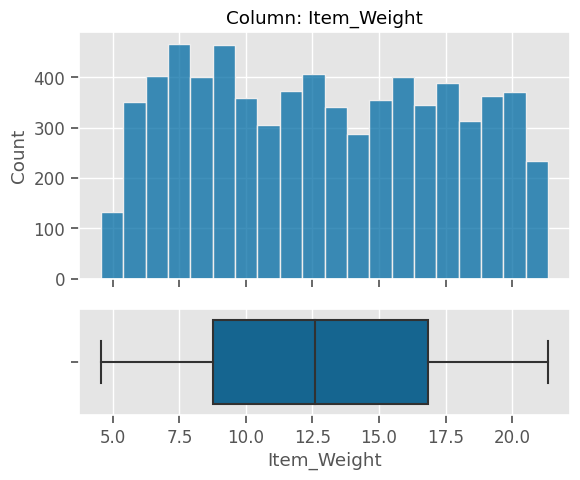

- NaN's Found: 1463 (17.17%)


In [ ]:
explore_numeric(df, 'Item_Weight')

In [ ]:
df['Item_Weight'].value_counts()

12.150    86
17.600    82
13.650    77
11.800    76
15.100    68
9.300     68
10.500    66
16.700    66
19.350    63
20.700    62
16.000    62
9.800     61
17.700    60
17.750    60
18.850    59
15.850    59
15.000    59
16.750    58
18.250    58
19.600    58
15.700    57
9.195     56
12.500    56
20.200    53
12.100    53
12.600    53
10.195    53
15.600    52
13.500    51
11.500    51
19.700    50
11.600    50
20.250    50
12.350    50
12.850    49
9.600     49
12.300    49
9.500     49
13.150    49
17.850    48
20.350    47
14.000    47
15.500    47
15.200    46
16.500    46
16.350    46
17.250    45
14.500    44
20.500    44
19.000    44
10.100    44
9.000     44
18.200    43
10.000    43
10.300    43
16.200    43
11.100    42
13.350    42
19.100    41
17.500    41
14.150    41
16.100    41
13.000    40
15.350    40
20.750    39
19.850    39
19.200    39
11.650    39
13.100    39
18.000    38
20.600    38
18.700    38
18.350    37
18.600    37
17.350    37
17.100    36
12.650    36

- **What type of feature is it?** *Numerical nieither ordinal or nominal*
  - **How many null values?** *1463 (17.17%)*
  - **What would you do with the null values?**  *impute with the mean weight*
  - **Is the feature constant or quasi-constant?** *Niether constant or quasi_constant*
  - **What is the cardinality? Is it high (>10)?** *Low cardinality*
  - **Would we know this feature before the target is determined?** *Yes*
  - **Is there a business case/understanding reason to exclude based on our business case?**  *No*

- Excluding 1463 NaN's


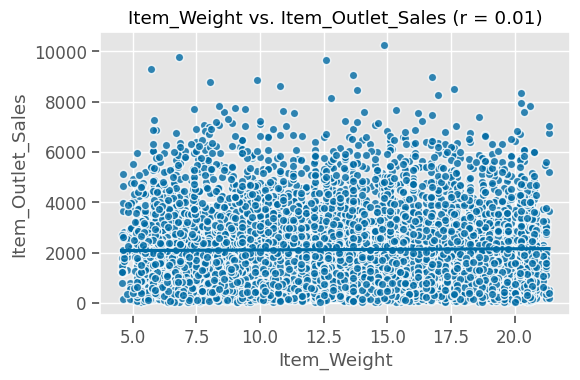

In [ ]:
plot_numeric_vs_target(df, 'Item_Weight',  'Item_Outlet_Sales');

  - **Based on business understanding, would this feature to be a predictor of the target?**  *No*
  - **Does this feature appear to be a predictor of the target?**  *No*


  ---Consider dropping this column---

####Item Visibility

*The percentage of total display area of all proucts in a store allocated to the particular product*

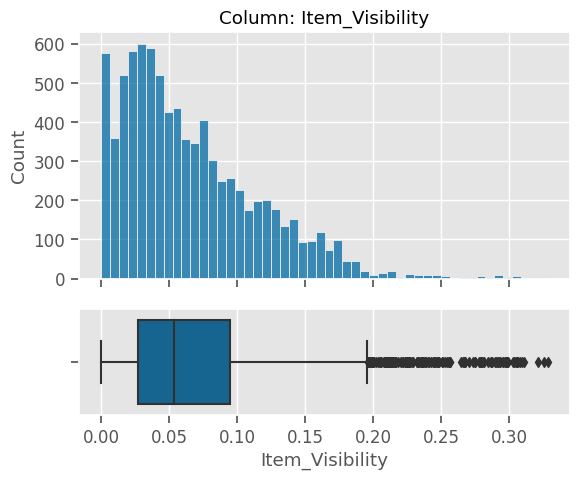

- NaN's Found: 0 (0.0%)


In [ ]:
explore_numeric(df, 'Item_Visibility')

  - **What type of feature is it?** *Numerical nieither ordinal or nominal*
  - **How many null values?** *0 (0.0%)*
  - **What would you do with the null values?**  *N/A*
  - **Is the feature constant or quasi-constant?** *Niether constant or quasi_constant*
  - **What is the cardinality? Is it high (>10)?** *Moderate cardinality*
  - **Would we know this feature before the target is determined?** *Yes*
  - **Is there a business case/understanding reason to exclude based on our business case?**  *No*

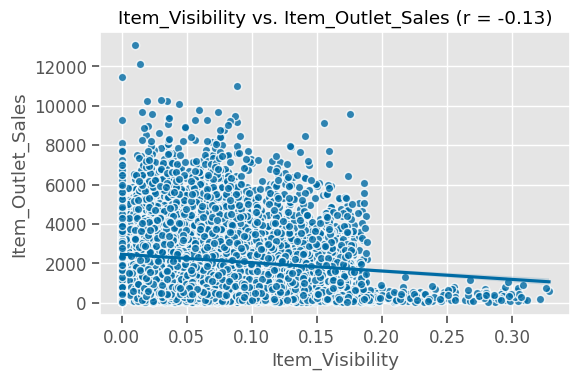

In [ ]:
plot_numeric_vs_target(df, 'Item_Visibility',  'Item_Outlet_Sales');

  - **Based on business understanding, would this feature to be a predictor of the target?**  *Yes*
  - **Does this feature appear to be a predictor of the target?**  *Not really*

####Item MRP

*Maximum Retail Price(list price) of the product*

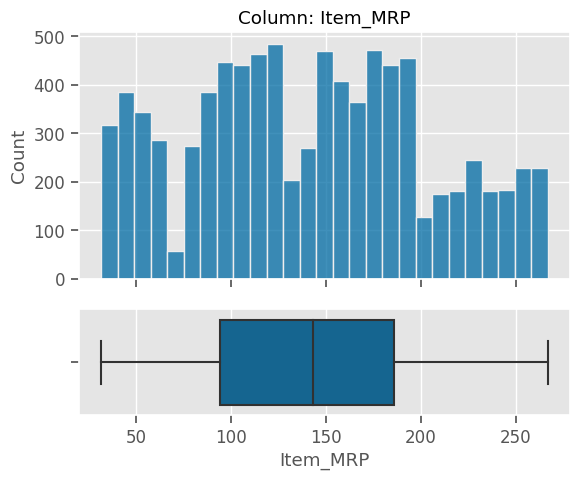

- NaN's Found: 0 (0.0%)


In [ ]:
explore_numeric(df, "Item_MRP")

  - **What type of feature is it?** *Numerical nieither ordinal or nominal*
  - **How many null values?** *0 (0.0%)*
  - **What would you do with the null values?**  *N/A*
  - **Is the feature constant or quasi-constant?** *Niether constant or quasi_constant*
  - **What is the cardinality? Is it high (>10)?** *Low cardinality*
  - **Would we know this feature before the target is determined?** *Yes*
  - **Is there a business case/understanding reason to exclude based on our business case?**  *No*

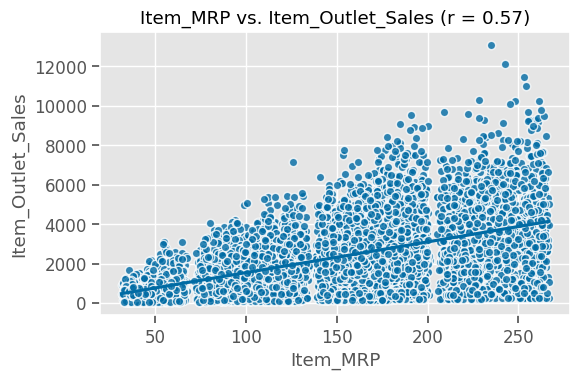

In [ ]:
plot_numeric_vs_target(df, "Item_MRP",  'Item_Outlet_Sales');

  - **Based on business understanding, would this feature to be a predictor of the target?**  *Yes*
  - **Does this feature appear to be a predictor of the target?**  *Yes*

####Outlet Establishment Year

*The year in which store was established*

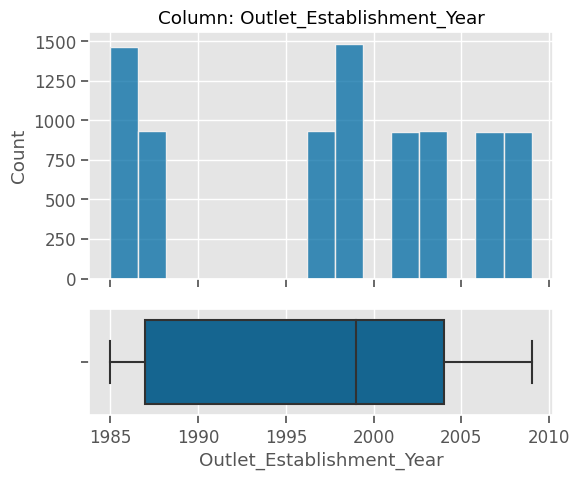

- NaN's Found: 0 (0.0%)


In [ ]:
explore_numeric(df, 'Outlet_Establishment_Year')

  - **What type of feature is it?** (Categorical (nominal), ordinal, numeric)
  - **How many null values? What percentage? What would you do with the null values (drop the rows? drop the column? impute? If impute, with what?)**
  - **Is the feature constant or quasi-constant?**
  - **What is the cardinality? Is it high (>10)?**
  - **Would we know this feature before the target is determined?**
  - **Is there a business case/understanding reason to exclude based on our business case?**

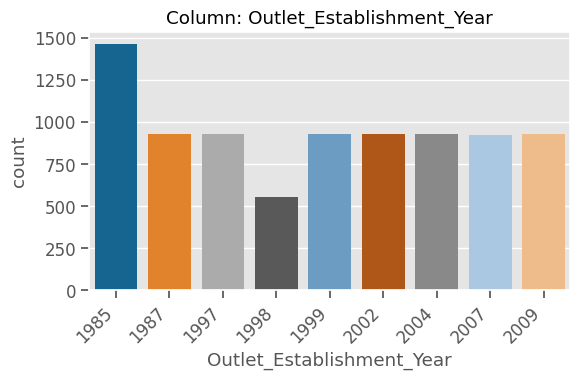

- NaN's Found: 0 (0.0%)
- Unique Values: 9
- Most common value: '1985' occurs 1463 times (17.17%)
- Not constant or quasi-constant.


(<Figure size 600x400 with 1 Axes>,
 <Axes: title={'center': 'Column: Outlet_Establishment_Year'}, xlabel='Outlet_Establishment_Year', ylabel='count'>)

In [ ]:
explore_categorical(df, 'Outlet_Establishment_Year', )

  - **What type of feature is it?** *Numerical nieither ordinal or nominal*
  - **How many null values?** *0 (0.0%)*
  - **What would you do with the null values?**  *N/A*
  - **Is the feature constant or quasi-constant?** *Niether constant or quasi_constant*
  - **What is the cardinality? Is it high (>10)?** *Low cardinality*
  - **Would we know this feature before the target is determined?** *Yes*
  - **Is there a business case/understanding reason to exclude based on our business case?**  *No*

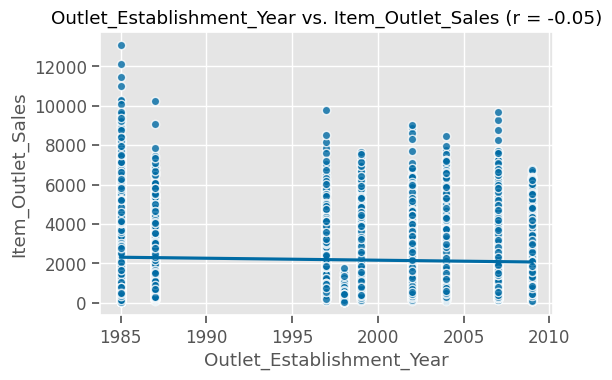

In [ ]:
plot_numeric_vs_target(df, 'Outlet_Establishment_Year',  'Item_Outlet_Sales');

  - **Based on business understanding, would this feature to be a predictor of the target?**  *No*
  - **Does this feature appear to be a predictor of the target?**  *No*

  ---Consider dropping this feature---

####Item Outlet Sales

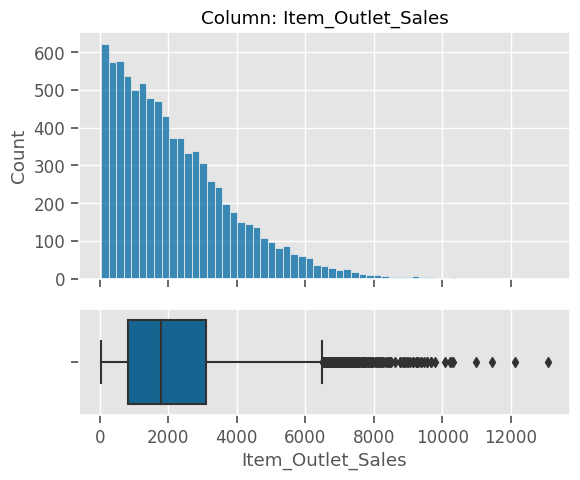

- NaN's Found: 0 (0.0%)


In [ ]:
explore_numeric(df, "Item_Outlet_Sales");

  - **What type of feature is it?** *Numerical nieither ordinal or nominal*
  - **How many null values?** *0 (0.0%)*
  - **What would you do with the null values?**  *N/A*
  - **Is the feature constant or quasi-constant?** *Niether constant or quasi_constant*
  - **What is the cardinality? Is it high (>10)?** *Low cardinality*
  - **Would we know this feature before the target is determined?** *This is our target*
  - **Is there a business case/understanding reason to exclude based on our business case?**  *This is our target*

#Process Data For Machine Learning


###Reprocess for Machine Learning

To redo the preprocessing a new dataset needs to be loaded

In [ ]:
fpath2 = '/content/drive/MyDrive/CodingDojo/02-IntroML/Week05/Data/sales_predictions_2023.csv'
df2 = pd.read_csv(fpath2)
df2.head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228
2,FDN15,17.50,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700
3,FDX07,19.20,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store,732.3800
4,NCD19,8.93,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052


In [ ]:
#Check datatypes
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Item_Identifier            8523 non-null   object 
 1   Item_Weight                7060 non-null   float64
 2   Item_Fat_Content           8523 non-null   object 
 3   Item_Visibility            8523 non-null   float64
 4   Item_Type                  8523 non-null   object 
 5   Item_MRP                   8523 non-null   float64
 6   Outlet_Identifier          8523 non-null   object 
 7   Outlet_Establishment_Year  8523 non-null   int64  
 8   Outlet_Size                6113 non-null   object 
 9   Outlet_Location_Type       8523 non-null   object 
 10  Outlet_Type                8523 non-null   object 
 11  Item_Outlet_Sales          8523 non-null   float64
dtypes: float64(4), int64(1), object(7)
memory usage: 799.2+ KB


**There are 11 features, Target(Item_Outlet_Sales) is an float64**

*7 object, 1 int64, and 4 float64*

*There are 8523 rows and 12 columns*

*Datatypes do not need to be changed*

####Checking for duplicates

In [ ]:
df2.duplicated().sum()

0

*There are no duplicates*

####Check for inconsistancies

In [ ]:
cat_cols2=df2.select_dtypes('object').columns
cat_cols2

Index(['Item_Identifier', 'Item_Fat_Content', 'Item_Type', 'Outlet_Identifier',
       'Outlet_Size', 'Outlet_Location_Type', 'Outlet_Type'],
      dtype='object')

In [ ]:
for col in cat_cols2:
  print(f'{col}:')
  print(df2[col].value_counts(dropna=False))
  print('\n')

Item_Identifier:
FDW13    10
FDG33    10
NCY18     9
FDD38     9
DRE49     9
FDV60     9
NCQ06     9
FDF52     9
FDX04     9
NCJ30     9
FDV38     9
NCF42     9
FDT07     9
FDW26     9
NCL31     9
FDU12     9
FDG09     9
FDQ40     9
FDX20     9
NCI54     9
FDX31     9
FDP25     9
FDW49     9
FDF56     9
FDO19     9
DRN47     9
NCB18     9
FDE11     8
NCX05     8
FDQ39     8
FDT55     8
FDO32     8
FDT40     8
FDZ20     8
FDH27     8
FDY49     8
FDS33     8
FDR04     8
FDR43     8
FDR59     8
FDJ55     8
FDT24     8
FDY55     8
FDV09     8
FDU23     8
FDY47     8
DRD25     8
FDK58     8
FDL58     8
FDX58     8
FDR44     8
FDP28     8
FDA39     8
FDH28     8
DRF27     8
FDX21     8
FDY56     8
FDF05     8
FDL20     8
FDY03     8
NCK05     8
FDS55     8
DRA59     8
FDG24     8
NCE54     8
FDZ21     8
FDA04     8
FDW24     8
FDT49     8
DRF23     8
FDD05     8
FDH10     8
FDX50     8
FDT32     8
FDK20     8
FDU13     8
FDN56     8
FDZ26     8
FDL34     8
DRF01     8
FDG38     8
NCE31     8

Item_Fat_Content: Has inconsistant values

Low Fat    5089 : low fat     112 : LF          316


reg         117 : Regular    2889


In [ ]:
df2['Item_Fat_Content'] = df2['Item_Fat_Content'].replace('LF', 'Low Fat')
df2['Item_Fat_Content'] = df2['Item_Fat_Content'].replace('low fat', 'Low Fat')
df2['Item_Fat_Content'] = df2['Item_Fat_Content'].replace('reg', 'Regular')

In [ ]:
#Check the change was made
df2['Item_Fat_Content'].value_counts(dropna=False)

Low Fat    5517
Regular    3006
Name: Item_Fat_Content, dtype: int64

####Identify Column with High Cardinality

In [ ]:
df2.nunique()/len(df2)*100

Item_Identifier              18.291681
Item_Weight                   4.869178
Item_Fat_Content              0.023466
Item_Visibility              92.455708
Item_Type                     0.187727
Item_MRP                     69.670304
Outlet_Identifier             0.117330
Outlet_Establishment_Year     0.105597
Outlet_Size                   0.035199
Outlet_Location_Type          0.035199
Outlet_Type                   0.046932
Item_Outlet_Sales            40.983222
dtype: float64

Item_Itentifier has a high cardinality.  This column will cause multicollinarity when one hot encoded and is unlikely to have and impact on outlet item sales.

Outlet_Establisment_Year has a high cardinality.  This column will cause multicollinarity when one hot encoded and is unlikely to have and impact on outlet item sales.


**Both of these columns will be dropped**

In [ ]:
df2=df2.drop(columns=['Item_Identifier', 'Outlet_Establishment_Year'])


In [ ]:
df2.head()

,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,Medium,Tier 1,Supermarket Type1,3735.1380
1,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,Medium,Tier 3,Supermarket Type2,443.4228
2,17.50,Low Fat,0.016760,Meat,141.6180,OUT049,Medium,Tier 1,Supermarket Type1,2097.2700
3,19.20,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,NaN,Tier 3,Grocery Store,732.3800
4,8.93,Low Fat,0.000000,Household,53.8614,OUT013,High,Tier 3,Supermarket Type1,994.7052


####Identify Features and Target

In [ ]:
target = 'Item_Outlet_Sales'
y=df2[target]

X=df2.drop(columns=target)

In [ ]:
#check attributes
type(y)

pandas.core.series.Series

In [ ]:
y.head()

0    3735.1380
1     443.4228
2    2097.2700
3     732.3800
4     994.7052
Name: Item_Outlet_Sales, dtype: float64

In [ ]:
type(X)

pandas.core.frame.DataFrame

In [ ]:
X.head()

,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Size,Outlet_Location_Type,Outlet_Type
0,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,Medium,Tier 1,Supermarket Type1
1,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,Medium,Tier 3,Supermarket Type2
2,17.50,Low Fat,0.016760,Meat,141.6180,OUT049,Medium,Tier 1,Supermarket Type1
3,19.20,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,NaN,Tier 3,Grocery Store
4,8.93,Low Fat,0.000000,Household,53.8614,OUT013,High,Tier 3,Supermarket Type1


####Train Test Split Data

In [ ]:
X_train, X_test, y_train, y_test=train_test_split(X,y, random_state=42)

####Check for missing values

In [ ]:
df2.isna().sum()

Item_Weight             1463
Item_Fat_Content           0
Item_Visibility            0
Item_Type                  0
Item_MRP                   0
Outlet_Identifier          0
Outlet_Size             2410
Outlet_Location_Type       0
Outlet_Type                0
Item_Outlet_Sales          0
dtype: int64

Item_Weight is missing 1463 values

Outlet_Size is missing 2410 values

##Create Pipelines for features

**Categorical Columns:**
  - Nominal: Item_Fat_Content, Outlet_Type, Item_type, Outlet_Identifier
  - Ordinal: Outlet_Size, Outlet_Location_Type


Nominal Columns: Item_Fat_Content, Outlet_Type, Item_type, Outlet_Identifier

  - Define the list of features
  - Instantiate Transformer
    -  Impute missing values with "missing" placeholder
    -  OneHotEncoded features
  - Instantiate pipeline

In [ ]:
cat_colsX=X_train.select_dtypes('object').columns
cat_colsX= cat_colsX.drop(['Outlet_Size', 'Outlet_Location_Type'])
cat_colsX

Index(['Item_Fat_Content', 'Item_Type', 'Outlet_Identifier', 'Outlet_Type'], dtype='object')

In [ ]:
#Instantiate the preprocessors

impute_missing= SimpleImputer(strategy='constant', fill_value='MISSING')

#OneHotEncoder
ohe_encoder= OneHotEncoder(sparse_output=False, handle_unknown='ignore')

#Pipeline
cat_pipeline = make_pipeline(impute_missing, ohe_encoder)
cat_pipeline



Pipeline(steps=[('simpleimputer',
                 SimpleImputer(fill_value='MISSING', strategy='constant')),
                ('onehotencoder',
                 OneHotEncoder(handle_unknown='ignore', sparse_output=False))])

Ordinal Columns:  Outlet_Size, Outlet_Type

  - Define the list of features
  - Instantiate Transformer
    -  Impute missing values with "NA"
    -  Ordinal Encoded
  - Instantiate pipeline

In [ ]:
#Define Ordinal Columns
ord_cols = ['Outlet_Size', 'Outlet_Location_Type']
ord_cols

['Outlet_Size', 'Outlet_Location_Type']

In [ ]:
#Instantiate Transformers

#Impute missing values
impute_ord= SimpleImputer(strategy='constant', fill_value='NA')

#Make ordinal encoder
#Specify order of categories
size_order=['NA', 'Small', 'Medium', 'High']
type_order=['NA', 'Tier 1', 'Tier 2', 'Tier 3']
#Make a list of order lists
ord_orders =[size_order, type_order]
#OrdinalEncoder
ord_encoder= OrdinalEncoder(categories=ord_orders)


ord_pipeline= make_pipeline(impute_ord, ord_encoder)
ord_pipeline

Pipeline(steps=[('simpleimputer',
                 SimpleImputer(fill_value='NA', strategy='constant')),
                ('ordinalencoder',
                 OrdinalEncoder(categories=[['NA', 'Small', 'Medium', 'High'],
                                            ['NA', 'Tier 1', 'Tier 2',
                                             'Tier 3']]))])

**Numeric Columns:**

Item_Weight, Item_Visibility, Item_MRP, Outlet_Establishment_Year

  - Define the list of features
  - Instantiate Transformer  
    - Impute missing values with "mean"
    - Ordinal Encoded
    - Scale using StandardScaler
  - Instantiate pipeline

In [ ]:
#Define number cols
num_cols=X_train.select_dtypes('number').columns
num_cols

Index(['Item_Weight', 'Item_Visibility', 'Item_MRP'], dtype='object')

In [ ]:
#Instantiate Transformers

#Impute with most_frequent
impute_num=SimpleImputer(strategy='mean')

#Scale data
scaler=StandardScaler()

#Pipeline
num_pipeline = make_pipeline(impute_num, scaler)
num_pipeline

Pipeline(steps=[('simpleimputer', SimpleImputer()),
                ('standardscaler', StandardScaler())])

####Make Tuples

In [ ]:
#make tupels for transformer
cat_tuple= ('object', cat_pipeline, cat_colsX)
cat_tuple

('object',
 Pipeline(steps=[('simpleimputer',
                  SimpleImputer(fill_value='MISSING', strategy='constant')),
                 ('onehotencoder',
                  OneHotEncoder(handle_unknown='ignore', sparse_output=False))]),
 Index(['Item_Fat_Content', 'Item_Type', 'Outlet_Identifier', 'Outlet_Type'], dtype='object'))

In [ ]:
ord_tuple = ('ordinal', ord_pipeline, ord_cols)
ord_tuple

('ordinal',
 Pipeline(steps=[('simpleimputer',
                  SimpleImputer(fill_value='NA', strategy='constant')),
                 ('ordinalencoder',
                  OrdinalEncoder(categories=[['NA', 'Small', 'Medium', 'High'],
                                             ['NA', 'Tier 1', 'Tier 2',
                                              'Tier 3']]))]),
 ['Outlet_Size', 'Outlet_Location_Type'])

In [ ]:
num_tuple = ('number', num_pipeline, num_cols)
num_tuple

('number',
 Pipeline(steps=[('simpleimputer', SimpleImputer()),
                 ('standardscaler', StandardScaler())]),
 Index(['Item_Weight', 'Item_Visibility', 'Item_MRP'], dtype='object'))

###Column Transformer

In [ ]:
#Instantiate ColumnTransformer
preprocessor= ColumnTransformer([cat_tuple, ord_tuple, num_tuple],
                                verbose_feature_names_out=False)

In [ ]:
#fit on training data
preprocessor.fit(X_train)


ColumnTransformer(transformers=[('object',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer(fill_value='MISSING',
                                                                strategy='constant')),
                                                 ('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False))]),
                                 Index(['Item_Fat_Content', 'Item_Type', 'Outlet_Identifier', 'Outlet_Type'], dtype='object')),
                                ('ordinal',
                                 Pipeline(steps=[('simpleimputer',
                                                  Simpl...
                                                 ('ordinalencoder',
                                                  OrdinalEncoder(categories=[['NA',
                                                                              'Small',
                                                                              'Medium',
                                                                              'High'],
                                                                             ['NA',
                                                                              'Tier '
                                                                              '1',
                                                                              'Tier '
                                                                              '2',
                                                                              'Tier '
                                                                              '3']]))]),
                                 ['Outlet_Size', 'Outlet_Location_Type']),
                                ('number',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer()),
                                                 ('standardscaler',
                                                  StandardScaler())]),
                                 Index(['Item_Weight', 'Item_Visibility', 'Item_MRP'], dtype='object'))],
                  verbose_feature_names_out=False)

In [ ]:
#Transform training data
X_train_processed = preprocessor.transform(X_train)
#Transform testing data
X_test_processed = preprocessor.transform(X_test)


In [ ]:
#confirm transformation
X_train_processed.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6392 entries, 4776 to 7270
Data columns (total 37 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Item_Fat_Content_Low Fat         6392 non-null   float64
 1   Item_Fat_Content_Regular         6392 non-null   float64
 2   Item_Type_Baking Goods           6392 non-null   float64
 3   Item_Type_Breads                 6392 non-null   float64
 4   Item_Type_Breakfast              6392 non-null   float64
 5   Item_Type_Canned                 6392 non-null   float64
 6   Item_Type_Dairy                  6392 non-null   float64
 7   Item_Type_Frozen Foods           6392 non-null   float64
 8   Item_Type_Fruits and Vegetables  6392 non-null   float64
 9   Item_Type_Hard Drinks            6392 non-null   float64
 10  Item_Type_Health and Hygiene     6392 non-null   float64
 11  Item_Type_Household              6392 non-null   float64
 12  Item_Type_Meat   

In [ ]:
X_train_processed.describe()

,Item_Fat_Content_Low Fat,Item_Fat_Content_Regular,Item_Type_Baking Goods,Item_Type_Breads,Item_Type_Breakfast,Item_Type_Canned,Item_Type_Dairy,Item_Type_Frozen Foods,Item_Type_Fruits and Vegetables,Item_Type_Hard Drinks,Item_Type_Health and Hygiene,Item_Type_Household,Item_Type_Meat,Item_Type_Others,Item_Type_Seafood,Item_Type_Snack Foods,Item_Type_Soft Drinks,Item_Type_Starchy Foods,Outlet_Identifier_OUT010,Outlet_Identifier_OUT013,Outlet_Identifier_OUT017,Outlet_Identifier_OUT018,Outlet_Identifier_OUT019,Outlet_Identifier_OUT027,Outlet_Identifier_OUT035,Outlet_Identifier_OUT045,Outlet_Identifier_OUT046,Outlet_Identifier_OUT049,Outlet_Type_Grocery Store,Outlet_Type_Supermarket Type1,Outlet_Type_Supermarket Type2,Outlet_Type_Supermarket Type3,Outlet_Size,Outlet_Location_Type,Item_Weight,Item_Visibility,Item_MRP
count,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.00000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6.392000e+03,6.392000e+03,6.392000e+03
mean,0.645964,0.354036,0.074781,0.027378,0.013141,0.075250,0.079318,0.098874,0.148310,0.026439,0.061014,0.108730,0.047247,0.020338,0.006571,0.14174,0.051783,0.019086,0.064925,0.107791,0.109199,0.110138,0.060075,0.113110,0.110920,0.109355,0.108730,0.105757,0.125000,0.651752,0.110138,0.113110,1.261108,2.121402,4.457566e-16,-6.169450e-17,4.668773e-17
std,0.478258,0.478258,0.263058,0.163195,0.113889,0.263815,0.270255,0.298516,0.355435,0.160450,0.239374,0.311324,0.212182,0.141164,0.080800,0.34881,0.221607,0.136839,0.246413,0.310141,0.311913,0.313086,0.237645,0.316752,0.314057,0.312109,0.311324,0.307551,0.330745,0.476452,0.313086,0.316752,0.987737,0.809870,1.000078e+00,1.000078e+00,1.000078e+00
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,-1.980409e+00,-1.291052e+00,-1.767529e+00
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,-8.075039e-01,-7.624234e-01,-7.638272e-01
50%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,2.000000,4.213344e-16,-2.318711e-01,3.400912e-02
75%,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,2.000000,3.000000,7.579511e-01,5.596016e-01,7.172910e-01
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.000000,3.000000,2.003199e+00,5.132050e+00,1.994559e+00


#Models

In [ ]:
#Create a Baseline Model
## Create an instance of the model
dummy = DummyRegressor(strategy='mean')
## Create a model pipeline
dummy_pipe = make_pipeline(preprocessor, dummy)
## Fit the model
dummy_pipe.fit(X_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('object',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(fill_value='MISSING',
                                                                                 strategy='constant')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  Index(['Item_Fat_Content', 'Item_Type', 'Outlet_Identifier', 'Outlet_Type'], dtype='object')),
                                                 ('ordinal',
                                                  P...
                                                                   OrdinalEncoder(categories=[['NA',
                                                                                               'Small',
                                                                                               'Medium',
                                                                                               'High'],
                                                                                              ['NA',
                                                                                               'Tier '
                                                                                               '1',
                                                                                               'Tier '
                                                                                               '2',
                                                                                               'Tier '
                                                                                               '3']]))]),
                                                  ['Outlet_Size',
                                                   'Outlet_Location_Type']),
                                                 ('number',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer()),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  Index(['Item_Weight', 'Item_Visibility', 'Item_MRP'], dtype='object'))],
                                   verbose_feature_names_out=False)),
                ('dummyregressor', DummyRegressor())])

In [ ]:
#Display model's metrics
scores_df = evaluate_regression(dummy_pipe, X_train, y_train,
                                X_test, y_test)
                               # model_name="Dummy Model")
display(scores_df)

Split,R^2,MAE,RMSE
Train,0.00,"1,360.22","1,720.31"
Test,-0.00,"1,326.12","1,664.98"


None

Build a Linear Regression Model to predict Sales
- Bulid a Linear Regression model
- Use custom function to get metrics
- Compare the training vs testing data R-squared values
- Run GridSearchCV if needed


In [ ]:
#Build a linear regression model
lin_reg = LinearRegression()
#Make pipeline
lin_reg_pipe = make_pipeline(preprocessor, lin_reg)
#Fit the Model on Training data
lin_reg_pipe.fit(X_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('object',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(fill_value='MISSING',
                                                                                 strategy='constant')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  Index(['Item_Fat_Content', 'Item_Type', 'Outlet_Identifier', 'Outlet_Type'], dtype='object')),
                                                 ('ordinal',
                                                  P...
                                                                   OrdinalEncoder(categories=[['NA',
                                                                                               'Small',
                                                                                               'Medium',
                                                                                               'High'],
                                                                                              ['NA',
                                                                                               'Tier '
                                                                                               '1',
                                                                                               'Tier '
                                                                                               '2',
                                                                                               'Tier '
                                                                                               '3']]))]),
                                                  ['Outlet_Size',
                                                   'Outlet_Location_Type']),
                                                 ('number',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer()),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  Index(['Item_Weight', 'Item_Visibility', 'Item_MRP'], dtype='object'))],
                                   verbose_feature_names_out=False)),
                ('linearregression', LinearRegression())])

In [ ]:
scores_lr = evaluate_regression(lin_reg_pipe, X_train, y_train,
                                X_test, y_test)
                                #model_name="Linear Regression Model")
#scores_df = pd.concat([scores_df, scores_lr])
#display(scores_df)

Split,R^2,MAE,RMSE
Train,0.56,850.94,"1,142.48"
Test,0.57,806.64,"1,093.85"


*The model is underfit meaning it has a high bias. It makes poor predictions on both the training and testing datasets.*

In [ ]:
lin_reg_pipe.get_params()

{'memory': None,
 'steps': [('columntransformer',
   ColumnTransformer(transformers=[('object',
                                    Pipeline(steps=[('simpleimputer',
                                                     SimpleImputer(fill_value='MISSING',
                                                                   strategy='constant')),
                                                    ('onehotencoder',
                                                     OneHotEncoder(handle_unknown='ignore',
                                                                   sparse_output=False))]),
                                    Index(['Item_Fat_Content', 'Item_Type', 'Outlet_Identifier', 'Outlet_Type'], dtype='object')),
                                   ('ordinal',
                                    Pipeline(steps=[('simpleimputer',
                                                     Simpl...
                                                    ('ordinalencoder',
                    

In [ ]:
# Define param grid with options to try
paramslr = {'linearregression__fit_intercept': [True, False],
             'linearregression__positive': [True, False]}

In [ ]:
GridSearchCV,
#Instantiate GridSearchCV
gridsearch = GridSearchCV(lin_reg_pipe, paramslr, n_jobs=-1, cv = 3, verbose=1)
#Fit the gridsearch on training data
gridsearch.fit(X_train, y_train)

Fitting 3 folds for each of 4 candidates, totalling 12 fits


GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('columntransformer',
                                        ColumnTransformer(transformers=[('object',
                                                                         Pipeline(steps=[('simpleimputer',
                                                                                          SimpleImputer(fill_value='MISSING',
                                                                                                        strategy='constant')),
                                                                                         ('onehotencoder',
                                                                                          OneHotEncoder(handle_unknown='ignore',
                                                                                                        sparse_output=False))]),
                                                                         Index(['Item_Fat_Content', 'Item_Type', 'Outlet_Identifier', 'Outlet_Type'], d...
                                                                         Pipeline(steps=[('simpleimputer',
                                                                                          SimpleImputer()),
                                                                                         ('standardscaler',
                                                                                          StandardScaler())]),
                                                                         Index(['Item_Weight', 'Item_Visibility', 'Item_MRP'], dtype='object'))],
                                                          verbose_feature_names_out=False)),
                                       ('linearregression',
                                        LinearRegression())]),
             n_jobs=-1,
             param_grid={'linearregression__fit_intercept': [True, False],
                         'linearregression__positive': [True, False]},
             verbose=1)

In [ ]:
#Obtain best params
gridsearch.best_params_

{'linearregression__fit_intercept': False, 'linearregression__positive': True}

In [ ]:
best_gs_lin_reg = gridsearch.best_estimator_
evaluate_regression(best_gs_lin_reg, X_train, y_train, X_test, y_test)


Split,R^2,MAE,RMSE
Train,0.56,847.34,"1,139.32"
Test,0.57,803.35,"1,092.52"


*This model performs the same as the default model*

Build a Random Forest Model to predict Sales
- Bulid a Random Forest model
- Use custom function to get metrics
- Compare the training vs testing data R-squared values
- Run GridSearchCV if needed

In [ ]:
#Build a RandomForest model
rf = RandomForestRegressor(random_state=42)
#Make pipeline
rf_pipe = make_pipeline(preprocessor, rf)
#Fit the Model on Training data
rf_pipe.fit(X_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('object',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(fill_value='MISSING',
                                                                                 strategy='constant')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  Index(['Item_Fat_Content', 'Item_Type', 'Outlet_Identifier', 'Outlet_Type'], dtype='object')),
                                                 ('ordinal',
                                                  P...
                                                                                               'High'],
                                                                                              ['NA',
                                                                                               'Tier '
                                                                                               '1',
                                                                                               'Tier '
                                                                                               '2',
                                                                                               'Tier '
                                                                                               '3']]))]),
                                                  ['Outlet_Size',
                                                   'Outlet_Location_Type']),
                                                 ('number',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer()),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  Index(['Item_Weight', 'Item_Visibility', 'Item_MRP'], dtype='object'))],
                                   verbose_feature_names_out=False)),
                ('randomforestregressor',
                 RandomForestRegressor(random_state=42))])

In [ ]:
scores_rf= evaluate_regression(rf_pipe, X_train,
                               y_train, X_test, y_test)
                               #model_name='Random Forest Model')
#display(scores_rf)

Split,R^2,MAE,RMSE
Train,0.94,296.64,428.48
Test,0.56,767.92,"1,104.75"


In [ ]:
#scores_df = pd.concat([scores_df, scores_rf])
#display(scores_df)

*The model is overfit meaning it has a high variance.  It does really well on training data but makes poor predictions on the testing datset.*

Use GridSearch CV to tune at hyperparameters for a RandomForest model

In [ ]:
rf_pipe.get_params()

{'memory': None,
 'steps': [('columntransformer',
   ColumnTransformer(transformers=[('object',
                                    Pipeline(steps=[('simpleimputer',
                                                     SimpleImputer(fill_value='MISSING',
                                                                   strategy='constant')),
                                                    ('onehotencoder',
                                                     OneHotEncoder(handle_unknown='ignore',
                                                                   sparse_output=False))]),
                                    Index(['Item_Fat_Content', 'Item_Type', 'Outlet_Identifier', 'Outlet_Type'], dtype='object')),
                                   ('ordinal',
                                    Pipeline(steps=[('simpleimputer',
                                                     Simpl...
                                                    ('ordinalencoder',
                    

In [ ]:
# Define param grid with options to try
paramsrf = {'randomforestregressor__max_depth': [None,10,15,20],
          'randomforestregressor__n_estimators':[10,100,150,200],
          'randomforestregressor__oob_score':[True,False],}

In [ ]:
GridSearchCV,
#Instantiate GridSearchCV
gridsearch = GridSearchCV(rf_pipe, paramsrf, n_jobs=-1, cv = 3, verbose=1)
#Fit the gridsearch on training data
gridsearch.fit(X_train, y_train)

Fitting 3 folds for each of 32 candidates, totalling 96 fits


GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('columntransformer',
                                        ColumnTransformer(transformers=[('object',
                                                                         Pipeline(steps=[('simpleimputer',
                                                                                          SimpleImputer(fill_value='MISSING',
                                                                                                        strategy='constant')),
                                                                                         ('onehotencoder',
                                                                                          OneHotEncoder(handle_unknown='ignore',
                                                                                                        sparse_output=False))]),
                                                                         Index(['Item_Fat_Content', 'Item_Type', 'Outlet_Identifier', 'Outlet_Type'], d...
                                                                         Index(['Item_Weight', 'Item_Visibility', 'Item_MRP'], dtype='object'))],
                                                          verbose_feature_names_out=False)),
                                       ('randomforestregressor',
                                        RandomForestRegressor(random_state=42))]),
             n_jobs=-1,
             param_grid={'randomforestregressor__max_depth': [None, 10, 15, 20],
                         'randomforestregressor__n_estimators': [10, 100, 150,
                                                                 200],
                         'randomforestregressor__oob_score': [True, False]},
             verbose=1)

In [ ]:
#Obtain best parameters
gridsearch.best_params_

{'randomforestregressor__max_depth': 10,
 'randomforestregressor__n_estimators': 100,
 'randomforestregressor__oob_score': True}

In [ ]:
best_gs = gridsearch.best_estimator_
evaluate_regression(best_gs, X_train, y_train, X_test, y_test)

#scores_df = pd.concat([scores_df, scores_gs])
#display(scores_df)

Split,R^2,MAE,RMSE
Train,0.72,643.57,908.96
Test,0.59,737.57,"1,061.69"


*This model has lowered variance, and is able to predict Outlet_Item_Sales within $740*

Build a Decision Tree Model to predict Sales
- Bulid a Decision Tree model
- Use custom function to get metrics
- Compare the training vs testing data R-squared values
- Run GridSearchCV if needed

In [ ]:
#Build a Decision Tree model
dt = DecisionTreeRegressor(random_state=42)
#Make pipeline
dt_pipe = make_pipeline(preprocessor, dt)
#Fit the Model on Training data
dt_pipe.fit(X_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('object',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(fill_value='MISSING',
                                                                                 strategy='constant')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  Index(['Item_Fat_Content', 'Item_Type', 'Outlet_Identifier', 'Outlet_Type'], dtype='object')),
                                                 ('ordinal',
                                                  P...
                                                                                               'High'],
                                                                                              ['NA',
                                                                                               'Tier '
                                                                                               '1',
                                                                                               'Tier '
                                                                                               '2',
                                                                                               'Tier '
                                                                                               '3']]))]),
                                                  ['Outlet_Size',
                                                   'Outlet_Location_Type']),
                                                 ('number',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer()),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  Index(['Item_Weight', 'Item_Visibility', 'Item_MRP'], dtype='object'))],
                                   verbose_feature_names_out=False)),
                ('decisiontreeregressor',
                 DecisionTreeRegressor(random_state=42))])

In [ ]:
scores_dt= evaluate_regression(rf_pipe, X_train,
                               y_train, X_test, y_test)

Split,R^2,MAE,RMSE
Train,0.94,296.64,428.48
Test,0.56,767.92,"1,104.75"


*The model is overfit meaning it has a high variance.  It does really well on training data but makes poor predictions on the testing datset.*

In [ ]:
dt_pipe.get_params()

{'memory': None,
 'steps': [('columntransformer',
   ColumnTransformer(transformers=[('object',
                                    Pipeline(steps=[('simpleimputer',
                                                     SimpleImputer(fill_value='MISSING',
                                                                   strategy='constant')),
                                                    ('onehotencoder',
                                                     OneHotEncoder(handle_unknown='ignore',
                                                                   sparse_output=False))]),
                                    Index(['Item_Fat_Content', 'Item_Type', 'Outlet_Identifier', 'Outlet_Type'], dtype='object')),
                                   ('ordinal',
                                    Pipeline(steps=[('simpleimputer',
                                                     Simpl...
                                                    ('ordinalencoder',
                    

In [ ]:
# Define param grid with options to try
paramsdt = {'decisiontreeregressor__splitter': ['best','random'],
          'decisiontreeregressor__max_depth': [1,2,3,4,5]}

In [ ]:
GridSearchCV,
#Instantiate GridSearchCV
gridsearch = GridSearchCV(dt_pipe, paramsdt, n_jobs=-1, cv = 3, verbose=1)
#Fit the gridsearch on training data
gridsearch.fit(X_train, y_train)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('columntransformer',
                                        ColumnTransformer(transformers=[('object',
                                                                         Pipeline(steps=[('simpleimputer',
                                                                                          SimpleImputer(fill_value='MISSING',
                                                                                                        strategy='constant')),
                                                                                         ('onehotencoder',
                                                                                          OneHotEncoder(handle_unknown='ignore',
                                                                                                        sparse_output=False))]),
                                                                         Index(['Item_Fat_Content', 'Item_Type', 'Outlet_Identifier', 'Outlet_Type'], d...
                                                                                          SimpleImputer()),
                                                                                         ('standardscaler',
                                                                                          StandardScaler())]),
                                                                         Index(['Item_Weight', 'Item_Visibility', 'Item_MRP'], dtype='object'))],
                                                          verbose_feature_names_out=False)),
                                       ('decisiontreeregressor',
                                        DecisionTreeRegressor(random_state=42))]),
             n_jobs=-1,
             param_grid={'decisiontreeregressor__max_depth': [1, 2, 3, 4, 5],
                         'decisiontreeregressor__splitter': ['best', 'random']},
             verbose=1)

In [ ]:
#Obtain best params
best_gs_dt=gridsearch.best_params_
best_gs_dt

{'decisiontreeregressor__max_depth': 5,
 'decisiontreeregressor__splitter': 'best'}

In [ ]:
best_gs_dt = gridsearch.best_estimator_
evaluate_regression(best_gs_dt, X_train, y_train, X_test, y_test)

Split,R^2,MAE,RMSE
Train,0.60,762.61,"1,082.65"
Test,0.59,738.32,"1,057.44"


*Variance has been lowered, and there is low bias. This model can predict Outlet_Item_Sales within $740*

##Test models for feature importance

In [ ]:
def annotate_hbars(ax, ha='left', va='center', size=12, xytext=(4,0),
                  textcoords='offset points'):
    for bar in ax.patches:

        ## calculate center of bar
        bar_ax = bar.get_y() + bar.get_height() / 2
        ## get the value to annotate
        val = bar.get_width()
        if val < 0:
            val_pos = 0
        else:
            val_pos = val
        # ha and va stand for the horizontal and vertical alignment
        ax.annotate(f"{val:.3f}", (val_pos,bar_ax), ha=ha, va=va, size=size,
                        xytext=xytext, textcoords=textcoords)

In [ ]:
def plot_coeffs(coeffs, top_n=None, figsize=(4,5),
                intercept=False, intercept_name="intercept",
                annotate=False, ha='left', va='center', size=12,
                xytext=(4,0), textcoords='offset points'):
    """ Plots the top_n coefficients from a Series, with optional annotations.
    """
    # Drop intercept if intercept=False and
    if (intercept == False) & (intercept_name in coeffs.index):
        coeffs = coeffs.drop(intercept_name)
    if top_n == None:
        ## sort all features and set title
        plot_vals = coeffs.sort_values()
        title = "All Coefficients - Ranked by Magnitude"
    else:
        ## rank the coeffs and select the top_n
        coeff_rank = coeffs.abs().rank().sort_values(ascending=False)
        top_n_features = coeff_rank.head(top_n)

        ## sort features and keep top_n and set title
        plot_vals = coeffs.loc[top_n_features.index].sort_values()
        title = f"Top {top_n} Largest Coefficients"
    ## plotting top N importances
    ax = plot_vals.plot(kind='barh', figsize=figsize)
    ax.set(xlabel='Coefficient',
            ylabel='Feature Names',
            title=title)
    ax.axvline(0, color='k')
    if annotate == True:
        annotate_hbars(ax, ha=ha, va=va, size=size, xytext=xytext, textcoords=textcoords)
    return ax

In [ ]:
def get_importances(model, feature_names=None,name='Feature Importance',
                   sort=False, ascending=True):

    ## checking for feature names
    if feature_names == None:
        feature_names = model.feature_names_in_

    ## Saving the feature importances
    importances = pd.Series(model.feature_importances_, index= feature_names,
                           name=name)

    # sort importances
    if sort == True:
        importances = importances.sort_values(ascending=ascending)

    return importances



In [ ]:
def plot_importance(importances, top_n=None,  figsize=(8,6)):
    # sorting with asc=false for correct order of bars
    if top_n==None:
        ## sort all features and set title
        plot_vals = importances.sort_values()
        title = "All Features - Ranked by Importance"
    else:
        ## sort features and keep top_n and set title
        plot_vals = importances.sort_values().tail(top_n)
        title = f"Top {top_n} Most Important Features"
    ## plotting top N importances
    ax = plot_vals.plot(kind='barh', figsize=figsize)
    ax.set(xlabel='Importance',
            ylabel='Feature Names',
            title=title)
    ## return ax in case want to continue to update/modify figure
    return ax




OneHotEncoder could be causing high multicollinarity, will redefine it and run linear regression again, then look at feature importance.

In [ ]:
ord_cols

['Outlet_Size', 'Outlet_Location_Type']

In [ ]:
num_cols

Index(['Item_Weight', 'Item_Visibility', 'Item_MRP'], dtype='object')

In [ ]:
cat_colsX

Index(['Item_Fat_Content', 'Item_Type', 'Outlet_Identifier', 'Outlet_Type'], dtype='object')

In [ ]:
#set new categorical cols with Ohe drop='first'
ohe_cols=cat_colsX

#instantiate preprocessors
impute_cat=SimpleImputer(strategy='constant', fill_value='MISSING')
ohe=OneHotEncoder(drop='first', sparse=False)

#Make pipeline
ohe_pipe=make_pipeline(impute_cat, ohe)
ohe_tuple = ('Categorical', ohe_pipe, ohe_cols)

#set new numeric pipeline w/o scaler
num_pipe2=make_pipeline(SimpleImputer(strategy='mean'))
num_tuple2 = ('Numeric', num_pipe2, num_cols)

#ordinal columns have no change

In [ ]:
col_transformer = ColumnTransformer([num_tuple2, ord_tuple, ohe_tuple], verbose_feature_names_out=False)
col_transformer

ColumnTransformer(transformers=[('Numeric',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer())]),
                                 Index(['Item_Weight', 'Item_Visibility', 'Item_MRP'], dtype='object')),
                                ('ordinal',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer(fill_value='NA',
                                                                strategy='constant')),
                                                 ('ordinalencoder',
                                                  OrdinalEncoder(categories=[['NA',
                                                                              'Small',
                                                                              'Medium',
                                                                              'High'],
                                                                             ['NA',
                                                                              'Tier '
                                                                              '1',
                                                                              'Tier '
                                                                              '2',
                                                                              'Tier '
                                                                              '3']]))]),
                                 ['Outlet_Size', 'Outlet_Location_Type']),
                                ('Categorical',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer(fill_value='MISSING',
                                                                strategy='constant')),
                                                 ('onehotencoder',
                                                  OneHotEncoder(drop='first',
                                                                sparse=False))]),
                                 Index(['Item_Fat_Content', 'Item_Type', 'Outlet_Identifier', 'Outlet_Type'], dtype='object'))],
                  verbose_feature_names_out=False)

In [ ]:
#Fit column transformer and get feature names
col_transformer.fit(X_train)
feature_names= col_transformer.get_feature_names_out()
feature_names

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


array(['Item_Weight', 'Item_Visibility', 'Item_MRP', 'Outlet_Size',
       'Outlet_Location_Type', 'Item_Fat_Content_Regular',
       'Item_Type_Breads', 'Item_Type_Breakfast', 'Item_Type_Canned',
       'Item_Type_Dairy', 'Item_Type_Frozen Foods',
       'Item_Type_Fruits and Vegetables', 'Item_Type_Hard Drinks',
       'Item_Type_Health and Hygiene', 'Item_Type_Household',
       'Item_Type_Meat', 'Item_Type_Others', 'Item_Type_Seafood',
       'Item_Type_Snack Foods', 'Item_Type_Soft Drinks',
       'Item_Type_Starchy Foods', 'Outlet_Identifier_OUT013',
       'Outlet_Identifier_OUT017', 'Outlet_Identifier_OUT018',
       'Outlet_Identifier_OUT019', 'Outlet_Identifier_OUT027',
       'Outlet_Identifier_OUT035', 'Outlet_Identifier_OUT045',
       'Outlet_Identifier_OUT046', 'Outlet_Identifier_OUT049',
       'Outlet_Type_Supermarket Type1', 'Outlet_Type_Supermarket Type2',
       'Outlet_Type_Supermarket Type3'], dtype=object)

In [ ]:
#Create a preprocessed dataframe
X_train_tf = pd.DataFrame(col_transformer.transform(X_train),
                          columns = feature_names, index= X_train.index)
X_test_tf = pd.DataFrame(col_transformer.transform(X_test),
                          columns = feature_names, index= X_test.index)

X_train_tf.head(1)

,Item_Weight,Item_Visibility,Item_MRP,Outlet_Size,Outlet_Location_Type,Item_Fat_Content_Regular,Item_Type_Breads,Item_Type_Breakfast,Item_Type_Canned,Item_Type_Dairy,Item_Type_Frozen Foods,Item_Type_Fruits and Vegetables,Item_Type_Hard Drinks,Item_Type_Health and Hygiene,Item_Type_Household,Item_Type_Meat,Item_Type_Others,Item_Type_Seafood,Item_Type_Snack Foods,Item_Type_Soft Drinks,Item_Type_Starchy Foods,Outlet_Identifier_OUT013,Outlet_Identifier_OUT017,Outlet_Identifier_OUT018,Outlet_Identifier_OUT019,Outlet_Identifier_OUT027,Outlet_Identifier_OUT035,Outlet_Identifier_OUT045,Outlet_Identifier_OUT046,Outlet_Identifier_OUT049,Outlet_Type_Supermarket Type1,Outlet_Type_Supermarket Type2,Outlet_Type_Supermarket Type3
4776,16.35,0.029565,256.4646,2.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


####Linear Regression Model

In [ ]:
LR= LinearRegression(fit_intercept= False, positive= True)
LR.fit(X_train_tf, y_train)

LinearRegression(fit_intercept=False, positive=True)

In [ ]:
evaluate_regression(LR, X_train_tf, y_train, X_test_tf, y_test)

Split,R^2,MAE,RMSE
Train,0.47,971.87,"1,252.35"
Test,0.48,926.64,"1,198.08"


#####Extracting and Visualizing Coefficients

In [ ]:
LR.coef_

array([   0.        ,    0.        ,   10.53552139,    0.        ,
          0.        ,    0.        ,    0.        ,    0.        ,
          0.        ,    0.        ,    0.        ,    0.        ,
          0.        ,    0.        ,    0.        ,    0.        ,
          0.        ,    0.        ,  194.13543854,    0.        ,
          0.        ,   12.98979736,    0.        ,  856.92463752,
        851.20630814,  534.59368454,    0.        , 2215.0232973 ,
        929.09147383,  723.51575238,  784.28566142,  882.67864263,
          0.        ,    0.        ,    0.        ,    0.        ])

In [ ]:
LR.feature_names_in_

array(['Item_Weight', 'Item_Visibility', 'Item_MRP', 'Outlet_Size',
       'Outlet_Location_Type', 'Item_Fat_Content_Regular',
       'Item_Type_Baking Goods', 'Item_Type_Breads',
       'Item_Type_Breakfast', 'Item_Type_Canned', 'Item_Type_Dairy',
       'Item_Type_Frozen Foods', 'Item_Type_Fruits and Vegetables',
       'Item_Type_Hard Drinks', 'Item_Type_Health and Hygiene',
       'Item_Type_Household', 'Item_Type_Meat', 'Item_Type_Others',
       'Item_Type_Seafood', 'Item_Type_Snack Foods',
       'Item_Type_Soft Drinks', 'Item_Type_Starchy Foods',
       'Outlet_Identifier_OUT010', 'Outlet_Identifier_OUT013',
       'Outlet_Identifier_OUT017', 'Outlet_Identifier_OUT018',
       'Outlet_Identifier_OUT019', 'Outlet_Identifier_OUT027',
       'Outlet_Identifier_OUT035', 'Outlet_Identifier_OUT045',
       'Outlet_Identifier_OUT046', 'Outlet_Identifier_OUT049',
       'Outlet_Type_Grocery Store', 'Outlet_Type_Supermarket Type1',
       'Outlet_Type_Supermarket Type2', 'Outlet_Type_Su

In [ ]:
coeffs = pd.Series(LR.coef_, index=LR.feature_names_in_)
coeffs['intercept']= LR.intercept_
coeffs

Item_Weight                           0.000000
Item_Visibility                       0.000000
Item_MRP                             10.535521
Outlet_Size                           0.000000
Outlet_Location_Type                  0.000000
Item_Fat_Content_Regular              0.000000
Item_Type_Baking Goods                0.000000
Item_Type_Breads                      0.000000
Item_Type_Breakfast                   0.000000
Item_Type_Canned                      0.000000
Item_Type_Dairy                       0.000000
Item_Type_Frozen Foods                0.000000
Item_Type_Fruits and Vegetables       0.000000
Item_Type_Hard Drinks                 0.000000
Item_Type_Health and Hygiene          0.000000
Item_Type_Household                   0.000000
Item_Type_Meat                        0.000000
Item_Type_Others                      0.000000
Item_Type_Seafood                   194.135439
Item_Type_Snack Foods                 0.000000
Item_Type_Soft Drinks                 0.000000
Item_Type_Sta

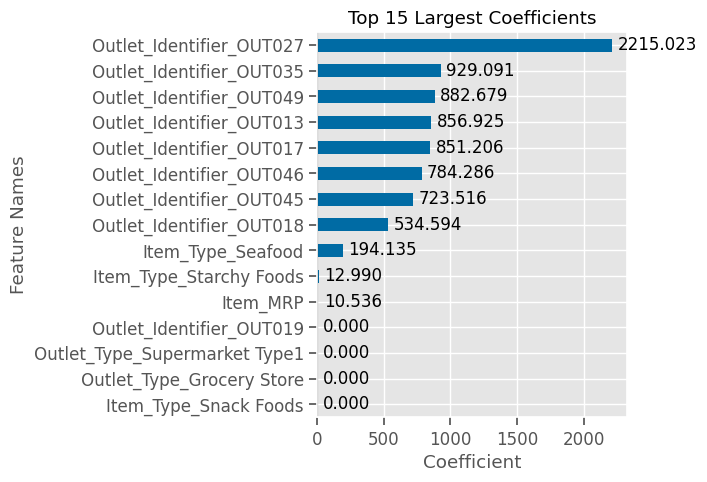

In [ ]:
plot_coeffs(coeffs, top_n=15, intercept=True, annotate=True);

The top 3 most impactful features using this model are Outlet_Identifier, Item_Type, and Item_MRP.  

- Outlet_Identifier:  This is the unique identifier for each outlet.  This feature is the most impactful on predeicting Outlet_Item_Sales. Depending on the Outlet, some are better than others at producing high sales numbers.

- Item_Type:  This is the type of item that is being sold.  This feature is made up of values like seafood, dairy, meats, etc... Seafood and Starchy food seem to be the best at producing high sales numbers.

- Item_MRP:  This is the maximum retail price of the object.  As this value goes up, the sales numbers will increase by 10.

####Tree Based Model: Decision Tree

In [ ]:
DT= DecisionTreeRegressor(max_depth=5, splitter='best')
DT.fit(X_train_tf, y_train)

DecisionTreeRegressor(max_depth=5)

In [ ]:
evaluate_regression(DT, X_train_tf, y_train, X_test_tf, y_test)

Split,R^2,MAE,RMSE
Train,0.60,762.61,"1,082.65"
Test,0.59,738.32,"1,057.44"


In [ ]:
importance= get_importances(DT, sort=True, ascending=False)
importance

Item_MRP                           0.552370
Outlet_Type_Grocery Store          0.320965
Outlet_Identifier_OUT027           0.099654
Outlet_Type_Supermarket Type3      0.025986
Item_Visibility                    0.000867
Item_Weight                        0.000080
Item_Fat_Content_Regular           0.000075
Item_Type_Meat                     0.000003
Item_Type_Baking Goods             0.000000
Outlet_Identifier_OUT010           0.000000
Outlet_Type_Supermarket Type2      0.000000
Outlet_Type_Supermarket Type1      0.000000
Outlet_Size                        0.000000
Outlet_Identifier_OUT049           0.000000
Outlet_Identifier_OUT046           0.000000
Outlet_Identifier_OUT045           0.000000
Outlet_Identifier_OUT035           0.000000
Outlet_Location_Type               0.000000
Outlet_Identifier_OUT019           0.000000
Outlet_Identifier_OUT018           0.000000
Outlet_Identifier_OUT017           0.000000
Outlet_Identifier_OUT013           0.000000
Item_Type_Starchy Foods         

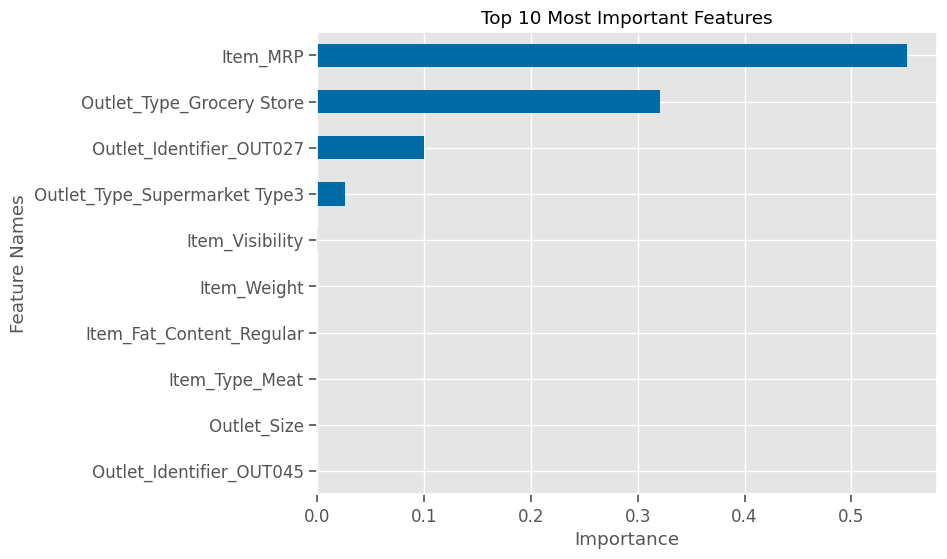

In [ ]:
plot_importance(importance, top_n=10);

####Top important features in the Decision Tree Model

**The top most importance features according to this model are the Item_MRP, Outlet_Type, Outlet_Identifier, Item_Visibilty, and Item_Weight.**

In [ ]:
plot_train = pd.concat([X_train_tf,y_train],axis=1)
plot_test = pd.concat([X_test_tf,y_test],axis=1)
plot_df = pd.concat([plot_train, plot_test])

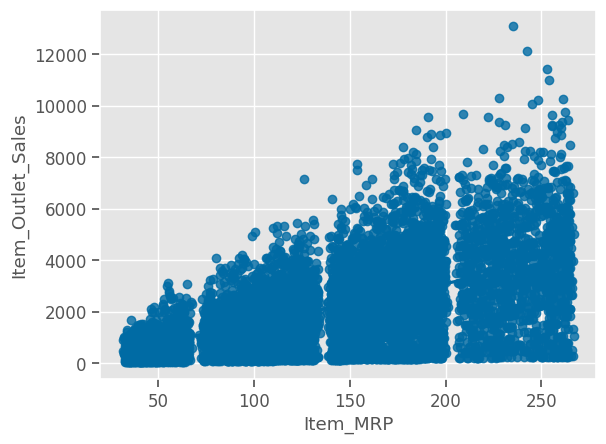

In [ ]:
sns.regplot(data=plot_df, x='Item_MRP', y='Item_Outlet_Sales');

##Evaluation

**Overall Recommended Model**

*The tuned Decision Tree Regressor model had the best performance*

**Interprertation of model's performance based on R-squared**

*Based on R-squared, the tuned Decision Tree Model had the best perfomance on both training and testing data. Bias was lower compared to other models. Variance was negligent compared to other models.*

**Another regression metric (RMSE/MAE/MSE) to express the performance of the model.**
*Looking at the MSE the Decision Tree Regressor model would predict within  $740 of the actual Item_Outlet_Sales.  Although the Random Forest model could also predict sales within that range, the Random Forest model had a high variance.*

**Comparing the training vs. test scores to see what extent is this model overfit/underfit?**

*This model performs very close to the sam  on the training data than on the testing data. This could indicate bias since the R2 score is at 60%*

**What changes would I make to this project**

  - *After looking at the important features, I would remove some of the other features that have a high cardinality.  With these features eliminated there may be a different dynamic to the dataset.*  
  - *I would consider dividing up some of the features with high cardinality into sub-groups to see how they truly impact the Item_Outlet_Sales.*
  - *There could be other ways to tune the model to change the bias*
  - *If the features that have a lot of NaN values show little impact on predictions, consider dropping those columns, as there is a lot of missing information.*
